# Intro

Check the readme files in the folder to learn how to run scans and use defaults vs specify parameters

# Initialize

In [1]:
cfg_file='aggron.yml'
expt_path = 'C:\\_Data\\Aggron\\2025_06_16\\'

ip = '192.168.137.1'
max_t1 = 150

## Imports

In [2]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm

from qick import QickConfig
import sys 

#sys.path.append('C:\\_Lib\qq\\slab_qick_calib')

from slab_qick_calib.exp_handling.instrumentmanager import InstrumentManager
import slab_qick_calib.experiments as meas
from slab_qick_calib.calib import qubit_tuning, measure_func
from slab_qick_calib.helpers import handy
from slab_qick_calib.calib.time_tracking import time_tracking


# Set color palette and font size
handy.config_figs()

<module 'slab_qick_calib.experiments' from 'C:\\_Lib\\python\\slab_qick_calib\\experiments\\__init__.py'>
C:\_Lib\python\slab_qick_calib\experiments
imported slab_qick_calib.experiments.general.qick_experiment
imported slab_qick_calib.experiments.general.qick_experiment_2q
imported slab_qick_calib.experiments.general.qick_program
C:\_Lib\python\slab_qick_calib\experiments\general
C:\_Lib\python\slab_qick_calib\experiments\single_qubit
imported slab_qick_calib.experiments.single_qubit.active_reset
imported slab_qick_calib.experiments.single_qubit.pulse_probe_spectroscopy
imported slab_qick_calib.experiments.single_qubit.rabi
imported slab_qick_calib.experiments.single_qubit.resonator_spectroscopy
imported slab_qick_calib.experiments.single_qubit.single_shot
imported slab_qick_calib.experiments.single_qubit.single_shot_opt
imported slab_qick_calib.experiments.single_qubit.stark_spectroscopy
imported slab_qick_calib.experiments.single_qubit.t1
imported slab_qick_calib.experiments.single_q

## Set up new config 
Set to variables to True when setting up a new experiment config file. 

Note: make sure you set your ADC/DAC channels correctly. This code does not automatically fill in the ADC/DAC into your configuration file, so you should check yourself to make sure these values are correct. 

There are several elements that you may want to customize based on your readout parameters and coherence times. Check readme file config_manual.md

In [3]:
# Set to false if you aren't creating a new one
new_config = False
new_folder = False

nqubits = 6
rfsoc_alias = 'bf3_soc'
t1_guess = 150 

import os
from slab_qick_calib.helpers import config

configs_dir = os.path.join(os.getcwd(),'../', 'configs')

cfg_file_path = os.path.join(configs_dir, cfg_file)
images_dir = os.path.join(expt_path, 'images')
summary_dir = os.path.join(images_dir, 'summary')

if new_config or new_folder:
    if new_config:
        config.init_config(cfg_file_path, nqubits, type='full', aliases=rfsoc_alias, t1=t1_guess)

    if not os.path.exists(expt_path):
        os.makedirs(expt_path)
        os.mkdir(images_dir)
        os.mkdir(summary_dir)

print('Data will be stored in', expt_path)

Data will be stored in C:\_Data\Aggron\2025_06_16\


## Connect to RFSoC
Before running first cell, make sure a nameserver is running on the network, the Qick board is connected to it, and the ip address listed below matches that of the nameserver. 

You just need to run the first cell, then should be able to run any other cell in whatever order. 

If you need to restart the RFSoC, you should reconnect it to the nameserver and rerun this. 

In [28]:
# Results config file
cfg_path = os.path.join(os.getcwd(),'..', 'configs', cfg_file)
auto_cfg = config.load(cfg_path)

# Connect to instruments
im = InstrumentManager(ns_address=ip)
print(im)
soc = QickConfig(im[auto_cfg['aliases']['soc']].get_cfg())
print(soc)

cfg_dict = {'soc': soc, 'expt_path': expt_path, 'cfg_file': cfg_path, 'im': im}

{'Pyro.NameServer': <Pyro4.core.Proxy at 0x24ab20b2b90; not connected; for PYRO:Pyro.NameServer@192.168.137.1:9090>, 'Qick105': <Pyro4.core.Proxy at 0x24ab2aa0ca0; not connected; for PYRO:obj_a5373103af8941d89bf538193bbc0565@192.168.137.105:33535>}
QICK running on RFSoC4x2, software version 0.2.353

Firmware configuration (built Sun Sep 29 15:34:24 2024):

	Global clocks (MHz): tProc dispatcher timing 614.400, RF reference 491.520
	Groups of related clocks: [tProc timing clock, DAC tile 0, DAC tile 2], [ADC tile 0]

	2 signal generator channels:
	0:	axis_signal_gen_v6 - fs=9830.400 Msps, fabric=614.400 MHz
		envelope memory: 65536 complex samples (6.667 us)
		32-bit DDS, range=9830.400 MHz
		DAC tile 0, blk 0 is DAC_B
	1:	axis_signal_gen_v6 - fs=9830.400 Msps, fabric=614.400 MHz
		envelope memory: 65536 complex samples (6.667 us)
		32-bit DDS, range=9830.400 MHz
		DAC tile 2, blk 0 is DAC_A

	2 readout channels:
	0:	axis_dyn_readout_v1 - configured by tProc output 2
		fs=4423.680 Msps,

## How to update config (you can also just edit yml directly)

In [5]:
# #                                          param   value qubit #
# auto_cfg = config.update_readout(cfg_path, 'lamb', 5, qi)
# auto_cfg = config.update_qubit(cfg_path, 'f_ge', 5700, qi)

# # For multiple levels of nesting: 
# auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), 0.2, qi)

## Print scan params

In [ ]:
t1 = meas.T1Experiment(cfg_dict, qi=0, print=True)

reps: 300
rounds: 1
expts: 60
start: 0
span: 555.0
acStark: False
active_reset: False
qubit: [0]
qubit_chan: 0


In general, all scans will be interacted with either by running default, or giving arguments from params dict. 
You can run scans on list of different qubits or just one by adding first couple lines of each cell. 
Flag of update is used to decide if to set new config vals based on output of scan (if the fit looks good)

# Check QICK issues

## Check mirror frequencies from resonators

In [ ]:
from slab_qick_calib.helpers import qick_check
qick_check.check_resonances(cfg_dict)

Nyquist frequency: 4915.2 MHz
Configured resonator frequencies (MHz):
[7145.3815 7174.3805 7000.     7246.6119 7247.044  7000.    ]
Aliased resonator frequencies (MHz):
[2685.0185 2656.0195 2830.4    2583.7881 2583.356  2830.4   ]


## Check mirror frequencies on qubit

In [ ]:
from slab_qick_calib.helpers import qick_check
qick_check.check_freqs(0, cfg_dict)

### Check sampling rates and minimum point spacing

In [41]:
fnyq = cfg_dict['soc']._get_ch_cfg(ro_ch=0)['f_dds']/2
clock_tick = 1e3*cfg_dict['soc'].cycles2us(1)
print(f'ADC Nyquist frequency is {fnyq} MHz')
print(f'1 clock tick is {clock_tick} ns')

ADC Nyquist frequency is 2211.84 MHz
1 clock tick is 1.6276041666666667 ns


In [45]:
from slab_qick_calib.helpers import qick_check

# Assuming 'soc' is your QickSoc object
dac_channel = qick_check.get_ch(soc, '0_228', type='dac')
print(f'DAC channel for 0_228 is: {dac_channel}')
from slab_qick_calib.helpers.qick_check import get_ch, print_dac_channels, print_adc_channels

print_dac_channels(cfg_dict['soc'])

DAC channel for 0_228 is: None
DAC Channels:
  0: DAC_B
  1: DAC_A


### Make sure you're not near the nyquist frequency of the ADC

In [46]:
from slab_qick_calib.helpers import qick_check
qick_check.check_adc(cfg_dict)

ADC sampling frequency: 4423.68


# Time of Flight (TOF)

TOF measures the time it takes for the signal to run through the wires. It will give us the time in clock ticks that we should wait to make a measurements 

 Use this to set trig_offset in config file

  0%|          | 0/1000 [00:00<?, ?it/s]

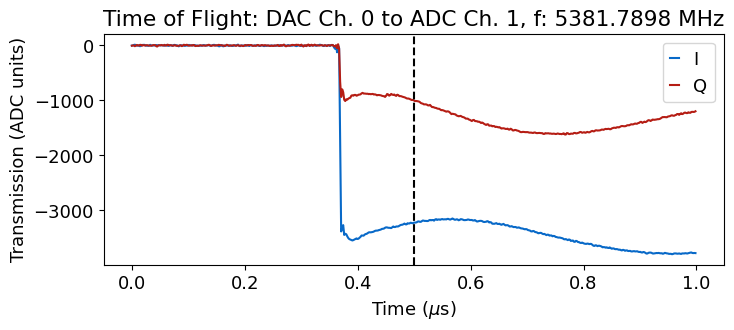

In [10]:
qubit_list = np.arange(3)
qubit_list = [0]
for qi in qubit_list:  
        tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi)

        # Set frequency of choice and readout length (up to 13 us for standard ZCU216 firmware, readout)
        #tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi,params={'readout_length':13})#,params={'frequency':fi})

## Set trig_offset to point where signal has appeared, usually around 300-500 ns

In [ ]:
qubit_list=np.arange(3)
for qi in qubit_list: 
    auto_cfg = config.update_readout(cfg_path, 'trig_offset', 0.65, qi)

## Collect many time traces of TOF data (for examining measurement data)

check_e first prepares e state

In [ ]:
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13})
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13,'check_e':True})

# Resonator Spectroscopy 

Run resonator spectroscopy for all resonators by choosing a large frequency scan to look over. The scan will then find the different resonators and fill in the config file with their respective frequencies. In the autocalibration, there will be a finer sweep of each resonator to more accurately find its frequency. The frequencies are saved in <code>auto_cfg.device.readout.frequency</code>

## Coarse 

This will perform peak finding
Use params to specify frequency range, averaging, gain, expts. 
If gain is too high, you may be in punch out region, where resonators disappear, or above it 

  0%|          | 0/10000000 [00:00<?, ?it/s]

Number of peaks: 0


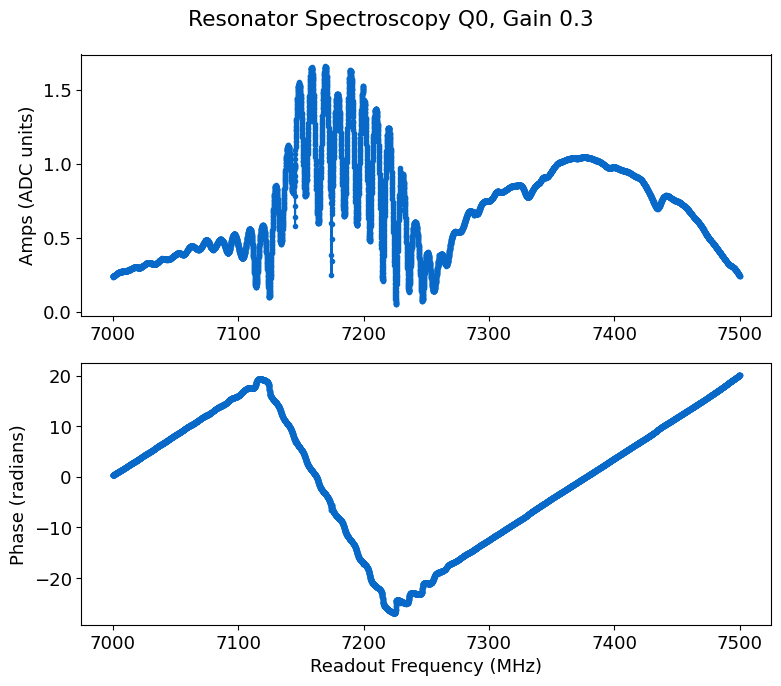

In [77]:
qi=0 # We only run this once for all qubits on a single feedline, this is a dummy value to make the scan work 
params={'start':7000, 'span':500, 'reps':1000, 'gain':0.3, 'expts':10000}
rspecc = meas.ResSpec(cfg_dict, qi=qi, style='coarse', progress=True, params=params)
res_values = rspecc.data['coarse_peaks']

Change prom (prominence value) to adjust how many peaks you find

Number of peaks: 8


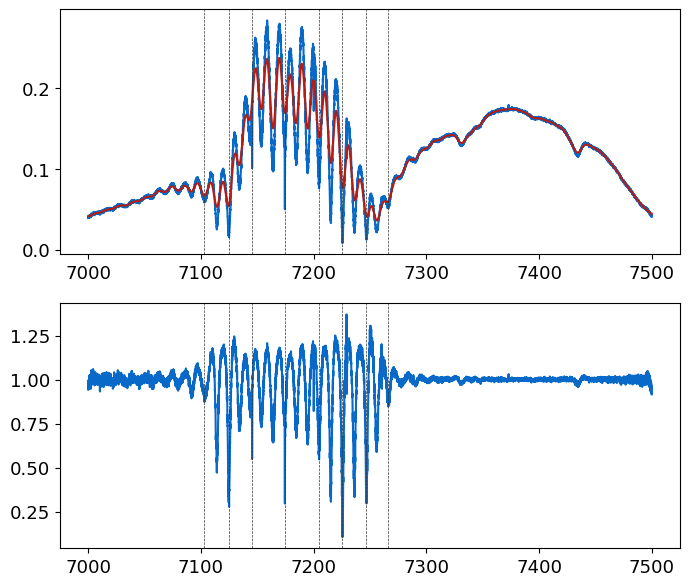

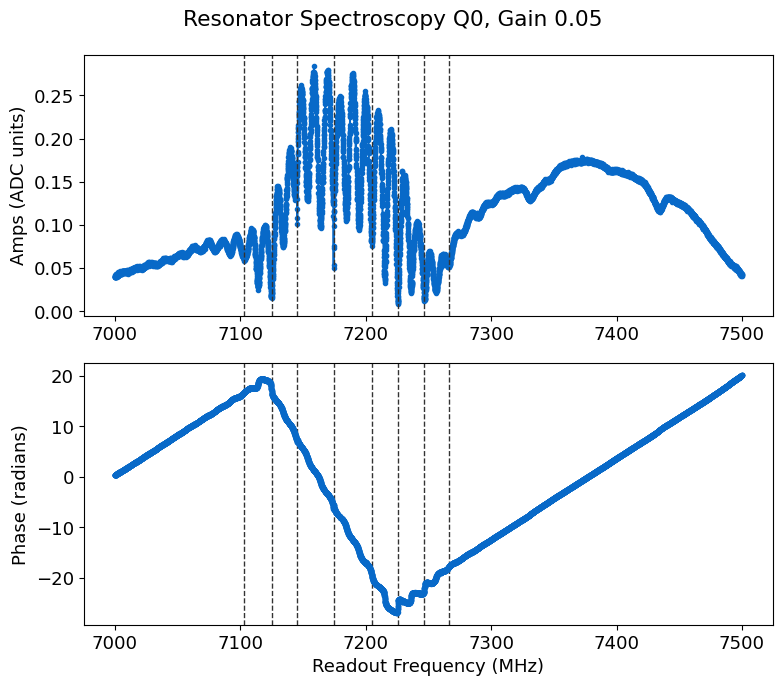

In [67]:
rspecc.analyze(peaks=True, debug=True, fit=False, prom=0.2)
rspecc.display(peaks=True, fit=False)
res_values = rspecc.data['coarse_peaks']

In [69]:
res_values

array([7103.18897095, 7125.03663712, 7145.43445816, 7174.48135529,
       7204.82811356, 7225.57589722, 7246.87362213, 7266.17156067])

Can delete values from res_values if they don't seem to be real res_values. 

In [72]:
res_values = np.delete(res_values, 0)

## Fine

This will fit the resonance amplitude

Can run scan with default options, or specify your own, by commenting out different lines and editing paramters. 

### First time after running coarse scan, using res_values list
Assumes you have the same number of res_values as qubits. 
First time you run scan, plot will appear weird first because it plots the resonator frequency in the config on the same plot. Just run again

  0%|          | 0/33000 [00:00<?, ?it/s]

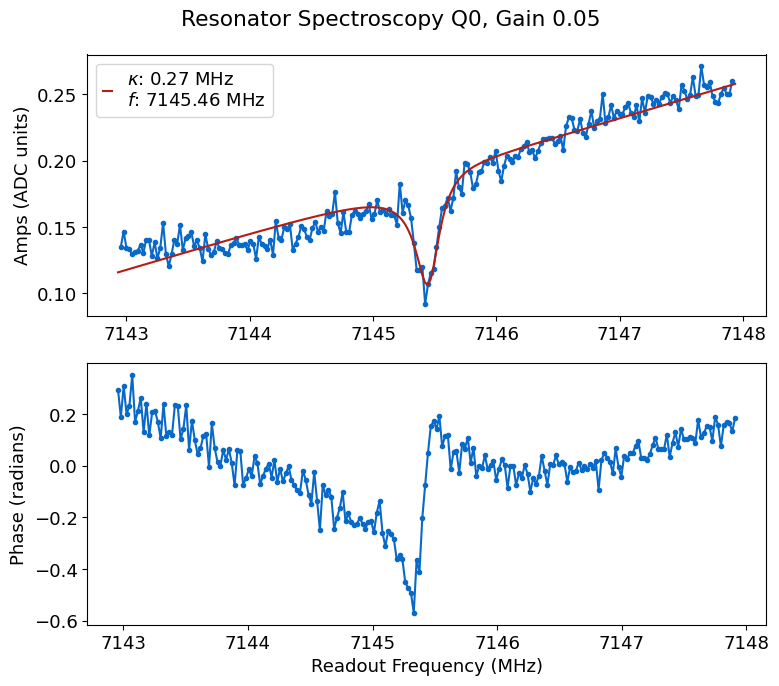

*Set cfg device.readout 0 frequency to 7145.4223 from 7000*
*Set cfg device.readout 0 kappa to 0.2727 from 0.5*
*Set cfg device.readout 0 qi to 4.6573 from 0*
*Set cfg device.readout 0 qe to 5.9895 from 0*


  0%|          | 0/33000 [00:00<?, ?it/s]

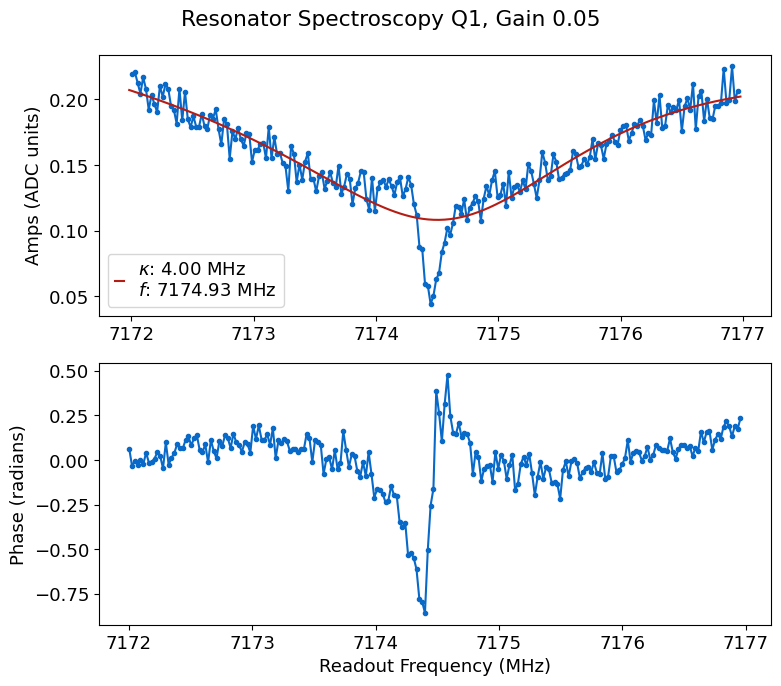

*Set cfg device.readout 1 frequency to 7174.4464 from 7000*
*Set cfg device.readout 1 kappa to 3.995 from 0.5*
*Set cfg device.readout 1 qi to 0.4411 from 0*
*Set cfg device.readout 1 qe to 0.3029 from 0*


  0%|          | 0/33000 [00:00<?, ?it/s]

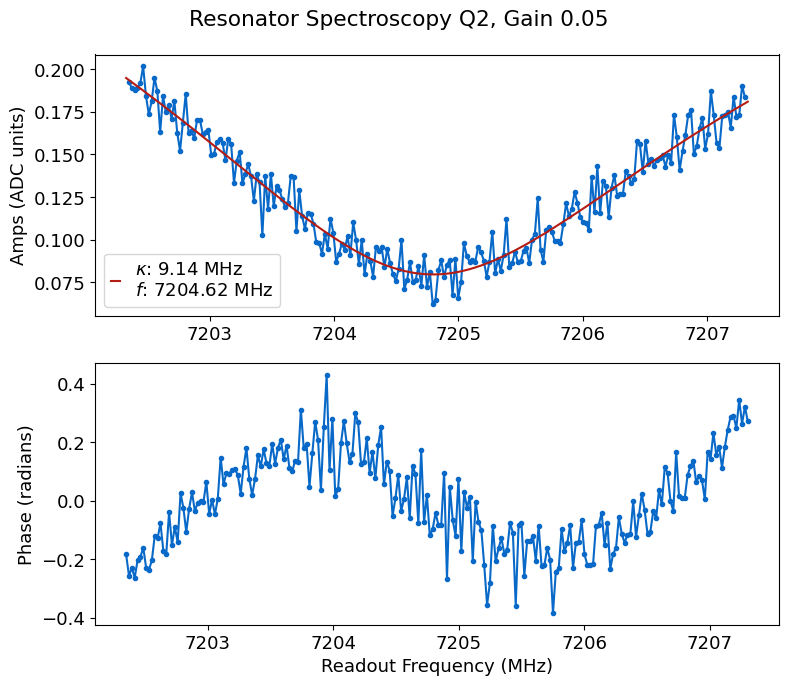

  0%|          | 0/33000 [00:00<?, ?it/s]

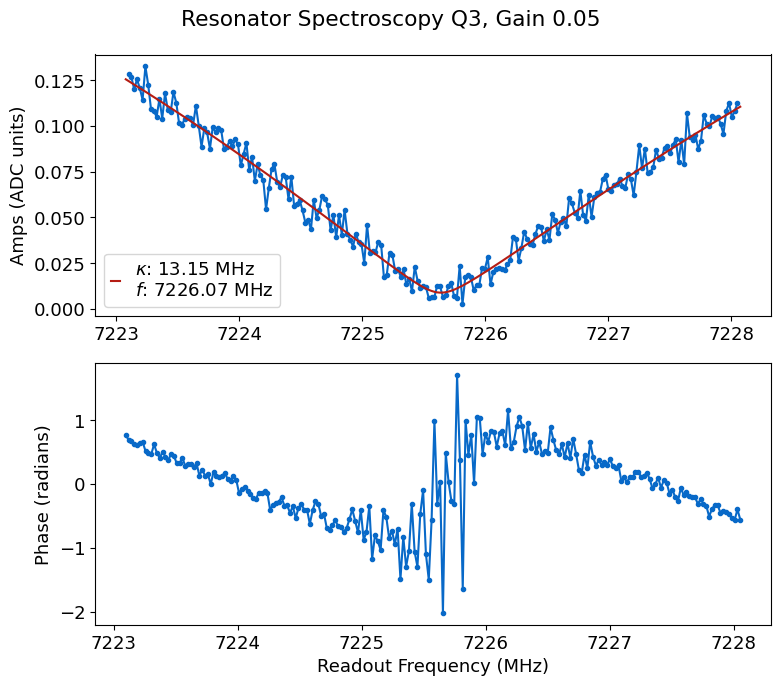

*Set cfg device.readout 3 frequency to 7225.8148 from 7000*
*Set cfg device.readout 3 kappa to 13.1464 from 0.5*
*Set cfg device.readout 3 qi to 2.6834 from 0*
*Set cfg device.readout 3 qe to 0.0561 from 0*


  0%|          | 0/33000 [00:00<?, ?it/s]

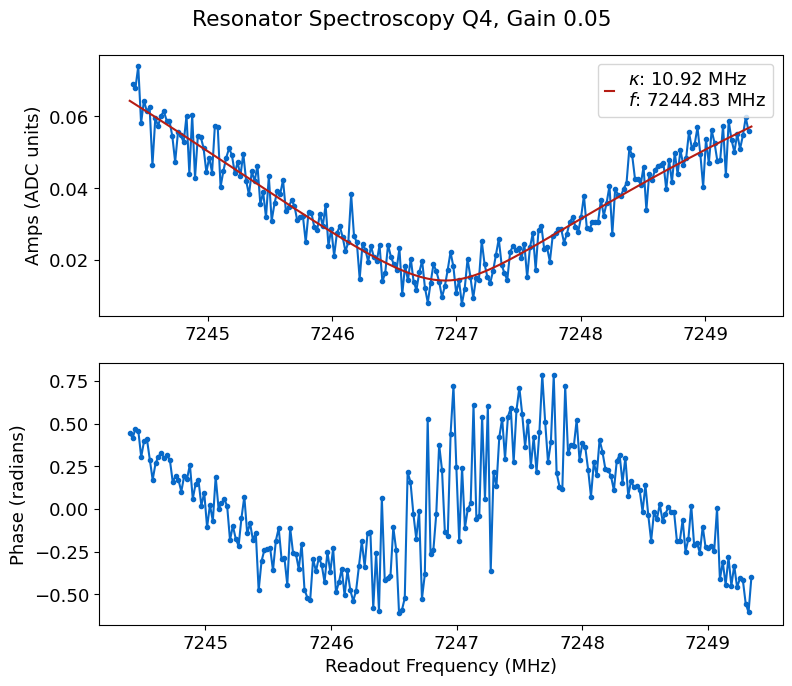

*Set cfg device.readout 4 frequency to 7247.044 from 7000*
*Set cfg device.readout 4 kappa to 10.9174 from 0.5*
*Set cfg device.readout 4 qi to 351624.1232 from 0*
*Set cfg device.readout 4 qe to 0.0664 from 0*


  0%|          | 0/33000 [00:00<?, ?it/s]

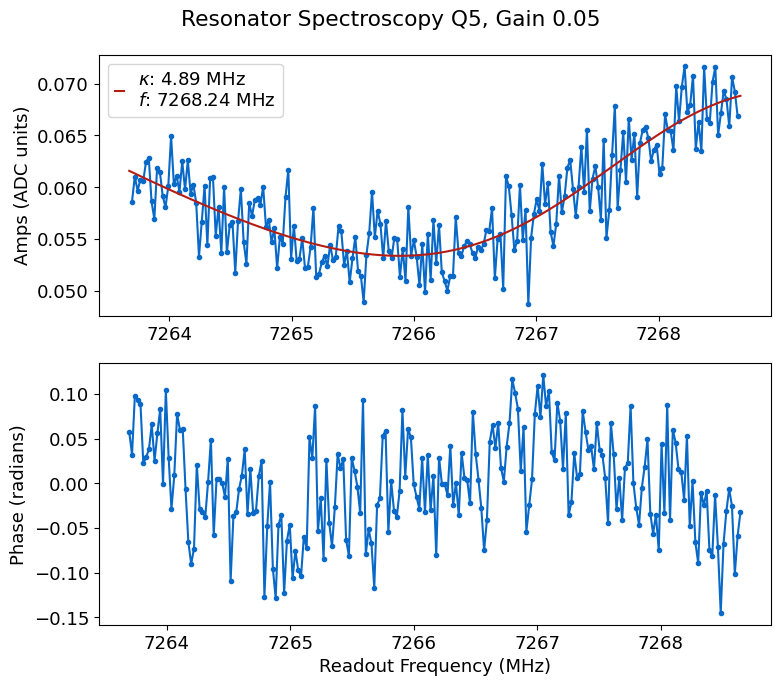

In [74]:
update=True

num_peaks = len(res_values)

for qi in range(len(res_values)):    
    # Used for initial finding of resonance 
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':5, 'center':res_values[qi]})

    if update: rspec.update(cfg_dict['cfg_file'])

### Fine resonator scan

Once the correct frequencies are saved to your config file. 

  0%|          | 0/33000 [00:00<?, ?it/s]

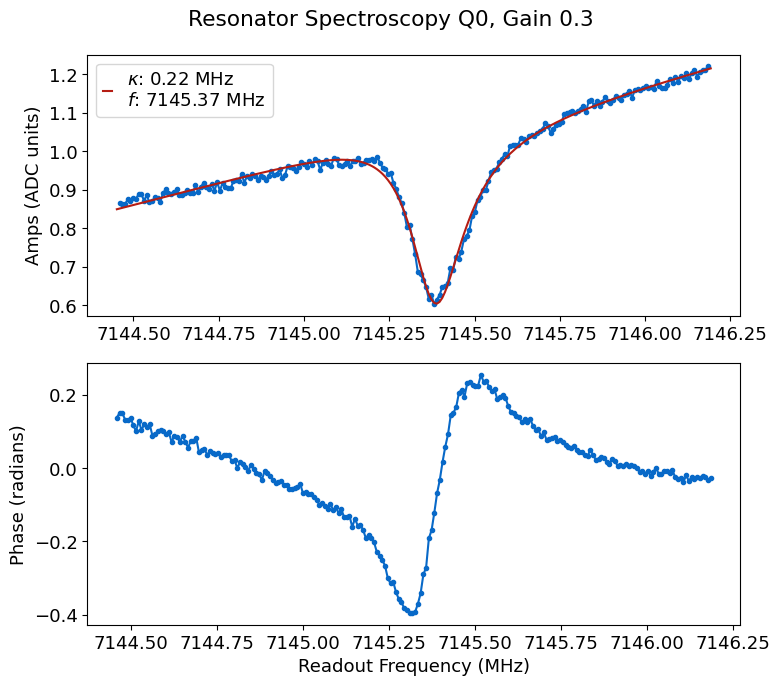

*Set cfg device.readout 0 frequency to 7145.3815 from 7145.3234*
*Set cfg device.readout 0 kappa to 0.2158 from 0.2492*
*Set cfg device.readout 0 qi to 5.8589 from 3.81*
*Set cfg device.readout 0 qe to 7.6129 from 11.5884*


In [86]:
update=True # Set to true if you want to update the config file with the new resonance values

# comment out one of these 
qubit_list = np.arange(3)
qubit_list=[0]

for qi in qubit_list:    
    # Manually set the span and gain 
    #rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':100, 'gain':0.01})

    # Fully automated, using previous fit to kappa to set span
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa'})
    if update: rspec.update(cfg_dict['cfg_file'])

### Print out scan params

In [ ]:
rspec.print()

## Resonator Power Spectroscopy 

Find a good value for gain to park your readout at until you run readout optimization. From the 2D sweep that is produced, choose a value for gain that is right before the resonator punches out. Want to choose a high value for gain because we want to be in the shot noise limited regime which increases our signal:noise ratio. 

  0%|          | 0/30 [00:00<?, ?it/s]

High power peak [MHz]: 7141.8669
Low power peak [MHz]: 7141.8838
Lamb shift [MHz]: -0.0169


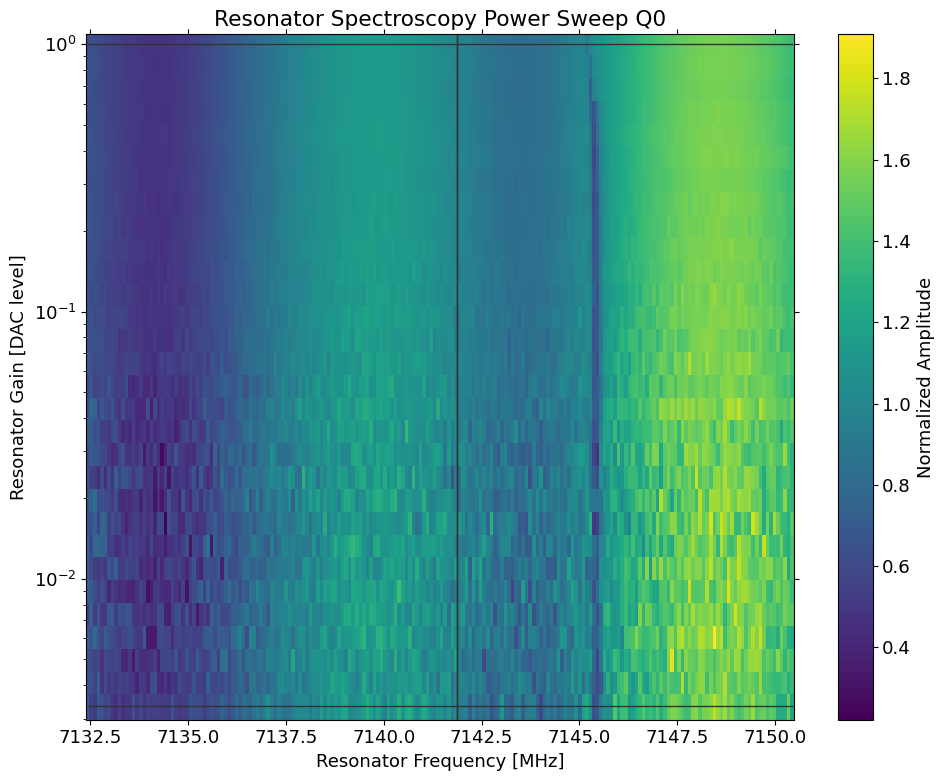

*Set cfg device.readout 0 lamb to -0.0169 from 0*


In [76]:
update=True

qubit_list = np.arange(3)
qubit_list=[0]

d=[]
for qi in qubit_list:
    #rpowspec=meas.ResSpecPower(cfg_dict, qi=qi)
    params={'rng':300,'max_gain':1, 'span':18,"f_off":4,'expts_gain':30}
    rpowspec=meas.ResSpecPower(cfg_dict, qi=qi, params=params)
    d.append(rpowspec)
    if update:
        auto_cfg = config.update_readout(cfg_path, 'lamb', rpowspec.data['lamb_shift'], qi)

### Example of plotting 2D scans for a bunch of qubits together
Can also use for varying a parameter on one qubit and plotting the results together

In [ ]:
auto_cfg = config.load(cfg_path)
horz_line = auto_cfg.device.readout.gain
handy.plot_many(d, title='Resonator Power', save_path=cfg_dict['expt_path'], chan='amps', yax='log', norm=True, horz_line=horz_line)

### Save gain values 

In [ ]:
# assign the resonator gain to the results config file
gain_values = [0.1,0.01]
for i, qi in enumerate(qubit_list):
    auto_cfg = config.update_readout(cfg_file, 'gain', gain_values[i], qi)

# Qubit Spectroscopy

## Find qubits
More automated, zooms out and adds power if no peak visible. Best to use if you're feeling confident, otherwise use more manual stuff in next cell. 

Performing medium scan


  0%|          | 0/30000 [00:00<?, ?it/s]

R2:0.294	Fit par error:0.088	 Best fit:b'avgi'


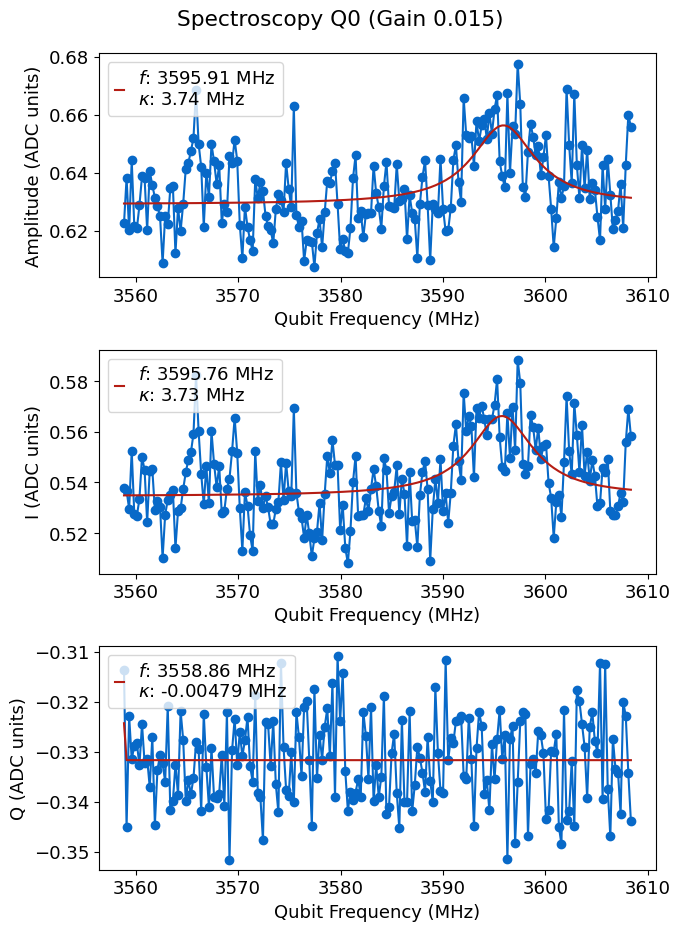

*Set cfg device.qubit 0 f_ge to 3595.7581 from 3583.6043*
Performing fine scan


  0%|          | 0/30000 [00:00<?, ?it/s]

C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:682: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(helpers.two_gaussians, bin_centers, hist, p0=p0)


R2:0.100	Fit par error:0.256	 Best fit:b'avgi'


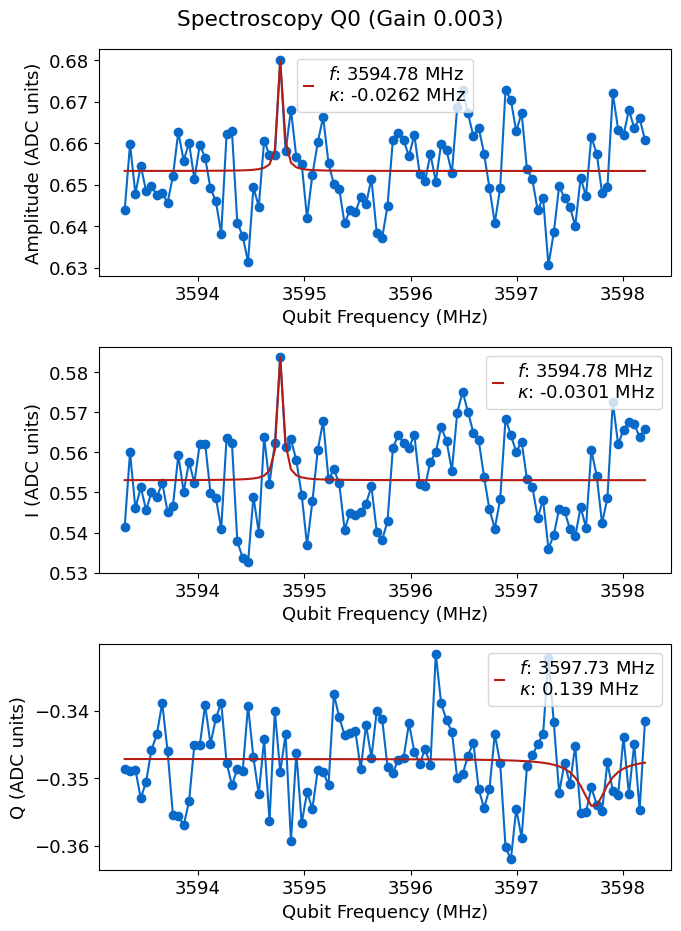

*Set cfg device.qubit 0 f_ge to 3594.7762 from 3595.7581*
Found qubit 0


In [97]:
qubit_list = np.arange(3)
qubit_list= [0]

bad_qubits=[]
for qi in qubit_list:
    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='medium')
    if not status:
        bad_qubits.append(qi)

## General search, specify width 

style options: fine, medium, coarse, huge (will change scan width and power)

Uses config values of low_gain (gain to use for finest scan), which sets overall gain for device and spec_gain (set indepedently for each qubit) to decide how much power to apply

You may also just want to do this fully manually by specifiying params. 

  0%|          | 0/50000 [00:00<?, ?it/s]

R2:0.307	Fit par error:0.129	 Best fit:b'amps'


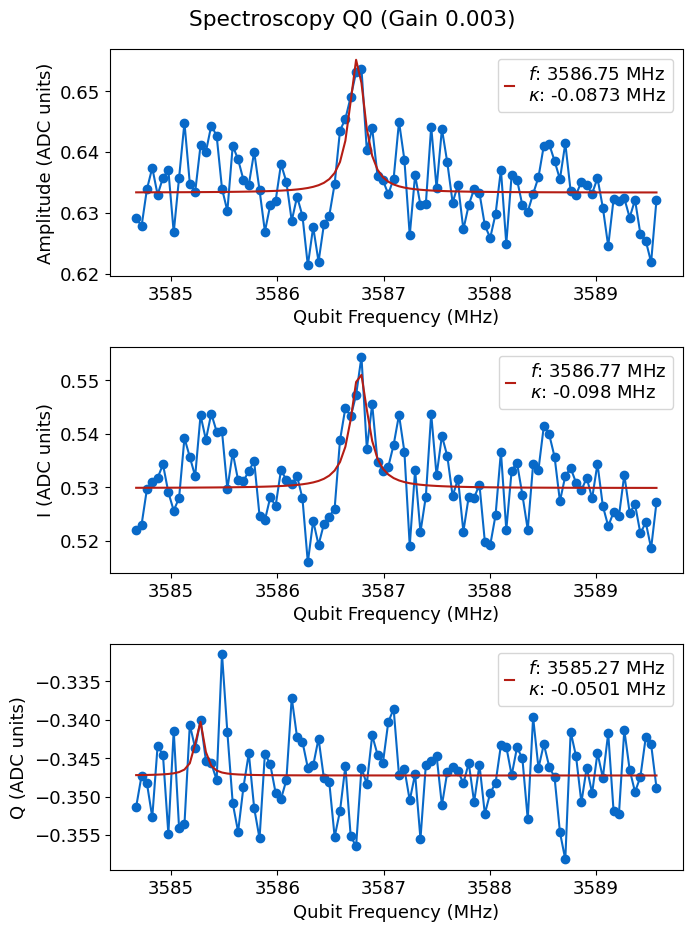

*Set cfg device.qubit 0 f_ge to 3586.7502 from 3587.12*
*Set cfg device.qubit 0 kappa to -0.1747 from 0.4979*


In [100]:
update=True

#qubit_list = np.arange(3)
qubit_list = [0]

for qi in qubit_list: 
    # Default params, just specify style 
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium')

    # Different examples of params you might give; frequency can be specified as start and span or if no start given, center is f_ge from config
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='fine')
    #params={'start':3300, 'span':500, 'gain':0.3}
    #params={'span':3,'expts':100,'gain':0.1,'sep_readout':True, 'length':3, 'readout_length':10, 'reps':10000}
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='coarse', params=params)
    if update and qspec.status: 
        auto_cfg = config.update_qubit(cfg_path, 'f_ge', qspec.data["best_fit"][2], qi)
        auto_cfg = config.update_qubit(cfg_path, 'kappa',2*qspec.data["best_fit"][3], qi)
    elif update:
        print(f'Bad qubit! qi={qi}')

## Stark (still getting it working)

In [ ]:
qi=2
qspec=meas.StarkSpec(cfg_dict, qi=qi, style='medium', params={'df_stark':0, 'max_stark_gain':0.2, 'df':-55,'span':130, 'stark_expts':50,'stark_rng':50})

## Power sweep

  0%|          | 0/10 [00:00<?, ?it/s]

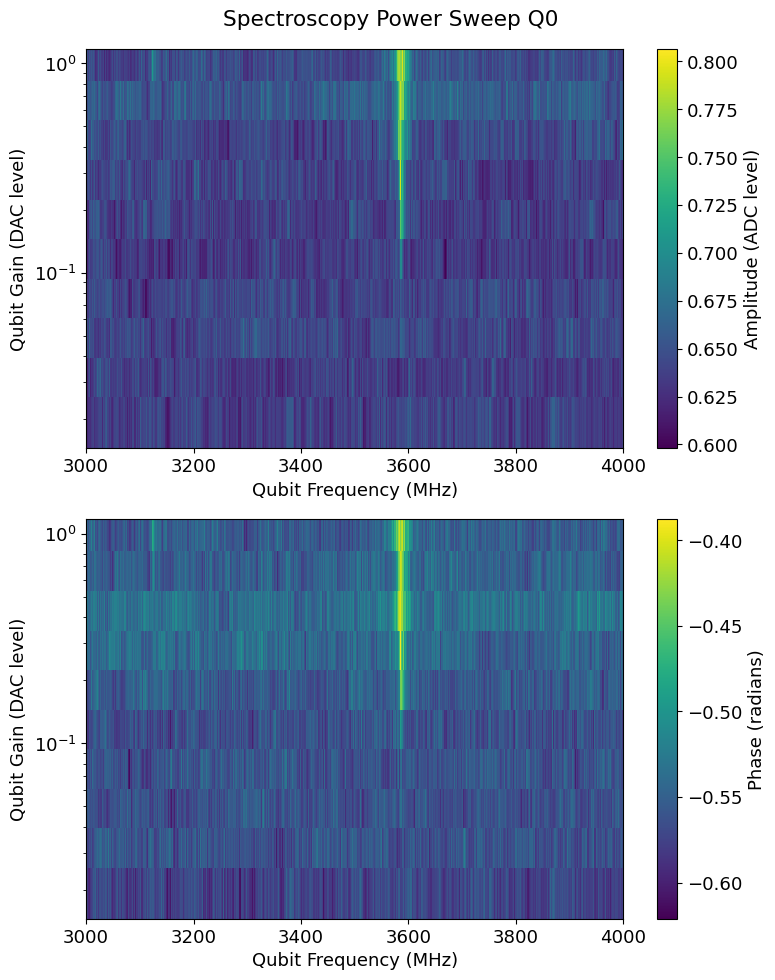

In [88]:
qubit_list=[0]

for qi in qubit_list:
    params={'start':3000,'span':1000,'expts':1000}
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params={'start':3700,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True})

### Sweep pulse length 
Useful when t1 low

sep_readout = False measures at same time as probe pulse (default is True)

In [ ]:
length = [1,3,5,10]
for l in length:
    for qi in qubit_list:
        params={'start':3700,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True}
        params={'start':5320,'span':100,'reps':1000,'expts':200,'length':l}
        qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
        #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)

### Narrow scan

  0%|          | 0/10 [00:00<?, ?it/s]

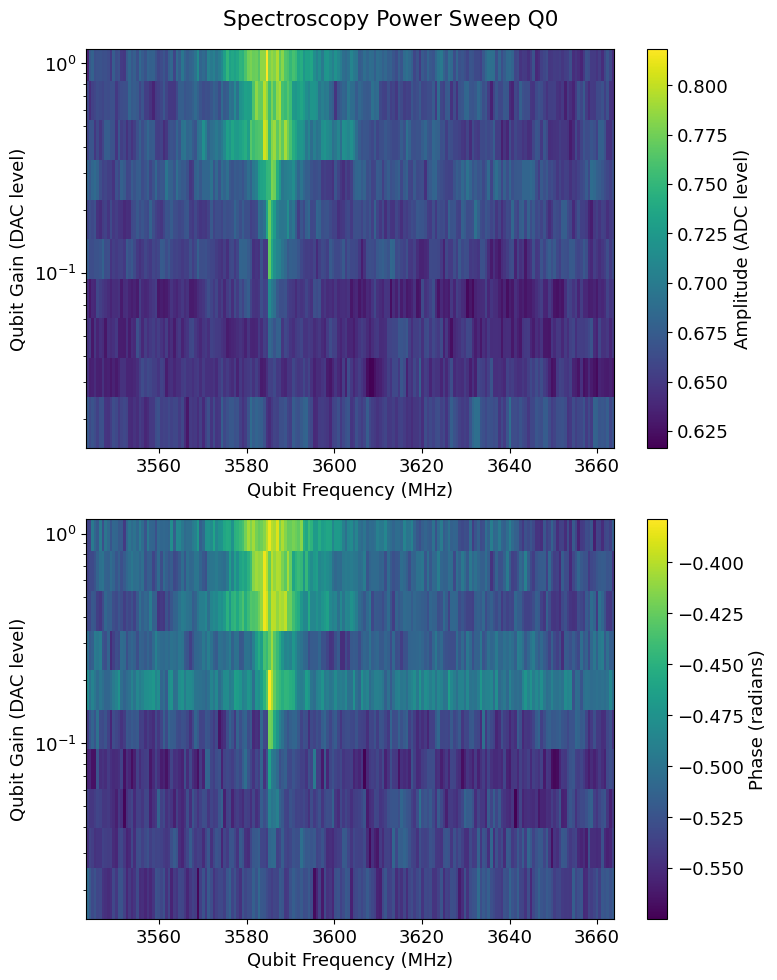

In [95]:
qq=[]

# qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list:
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='narrow')
    
    # Nice for pretty pics once you have T1 measurement. 
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='fine', params={'length':'t1','max_gain':1})
    qq.append(qspec_pow)

# When measuring many qubits, can do a bunch of color plots this way
#handy.plot_many(qq, title='Qubit Power Amps 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='amps')
#handy.plot_many(qq, title='Qubit Power Phase 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='phases')

### Multiple wide scans looking for qubit

In [ ]:
qubit_list = np.arange(3)
qubit_list=[1]

span = 250
start_all = [2000, 3100, 3400]
end_all = [4780, 3700, 4250]
sensitivities = [0.8, 0.4, 0.2]

d = []
for qi in tqdm(qubit_list, desc='Qubit Number'):
    starts = np.arange(start_all[qi], end_all[qi], span)
    qresults = []
    for start in tqdm(starts, desc=f'Start Frequency Sweep'):
        q_res = meas.QubitSpecPower(
            cfg_dict, 
            qi=qi, 
            style='coarse', 
            params={
                'max_gain':0.8,
                'start':start,
                'span':span,
                'rng':100,
                'reps':800}
        )#,'start':3000,'span':300'})
        qresults.append(q_res)
    
    # Handy plot
    handy.plot_many_limited(
        qresults, 
        title=f'Qubit Power for qubit {qi}', 
        save_path=cfg_dict['expt_path'],
        yax='log', 
        chan='amps', 
        individial_fig_size= (6,6), 
        xlabel='Frequency (MHz)',
        sensitivity =  sensitivities[qi],
        save = False,
    )
    d.append(q_res)
    plt.show()

# Coherent scans

## Fast tuneup

Options are: 

first_time: assume we don't know t1 time,don't have single shot working

single: do single shot readout optimization 

readout: set readout frequency based on resonator fit

  0%|          | 0/33000 [00:00<?, ?it/s]

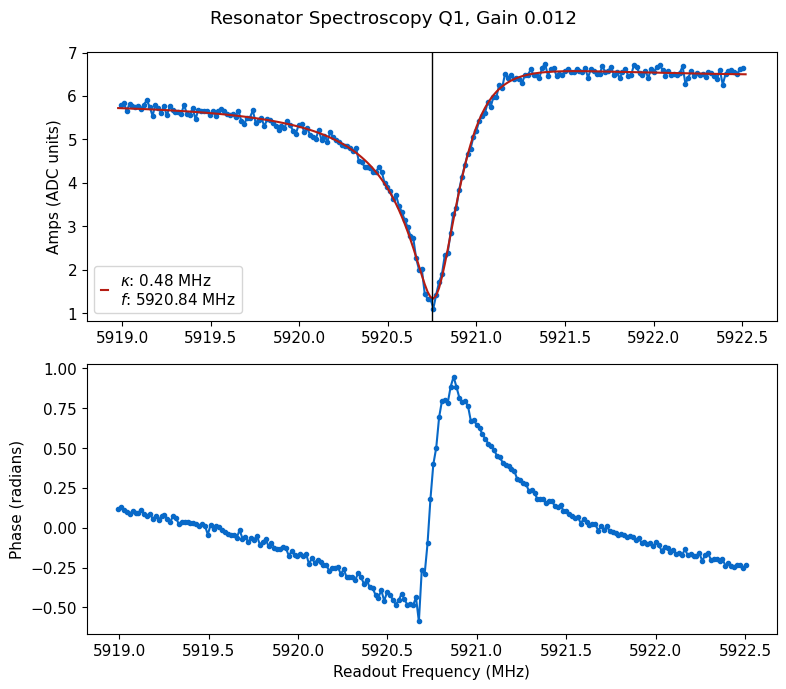

*Set cfg device.readout 1 frequency to 5920.7566 from 5920.7489*
*Set cfg device.readout 1 kappa to 0.4845 from 0.506*
*Set cfg device.readout 1 qi to 7.8285 from 6.0028*
*Set cfg device.readout 1 qe to 1.448 from 1.4533*


  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

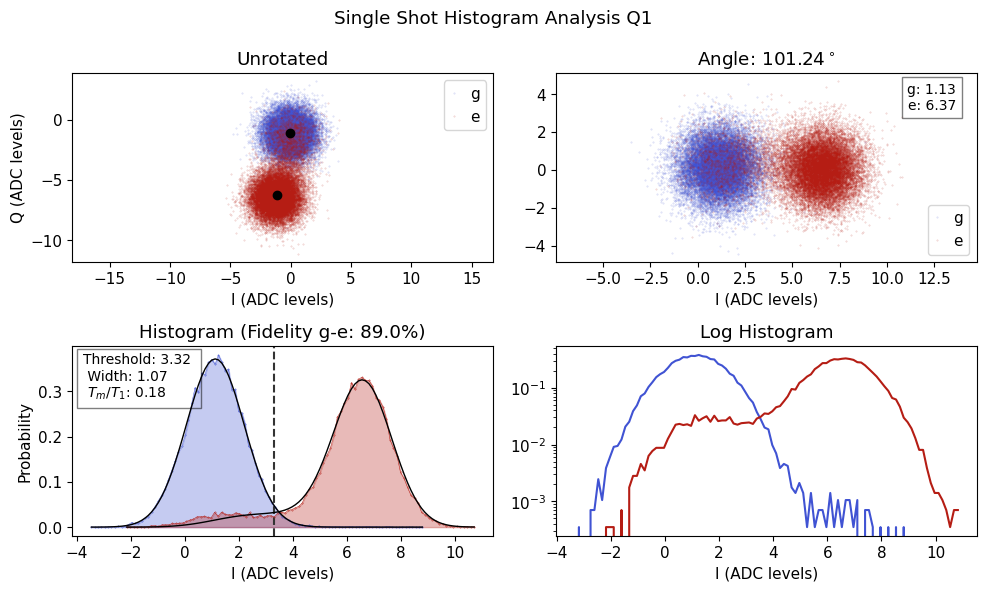

*Set cfg device.readout 1 phase to 101.235 from -144.238*
*Set cfg device.readout 1 threshold to 3.3212 from 3.3986*
*Set cfg device.readout 1 fidelity to 0.8898 from 0.8805*
*Set cfg device.readout 1 sigma to 1.074 from 1.0591*
*Set cfg device.readout 1 tm to 0.1771 from 0.2147*
*Set cfg device.qubit 1 tuned_up to True from True*


  0%|          | 0/2 [00:00<?, ?it/s]

R2:0.986	Fit par error:0.017	 Best fit:b'amps'


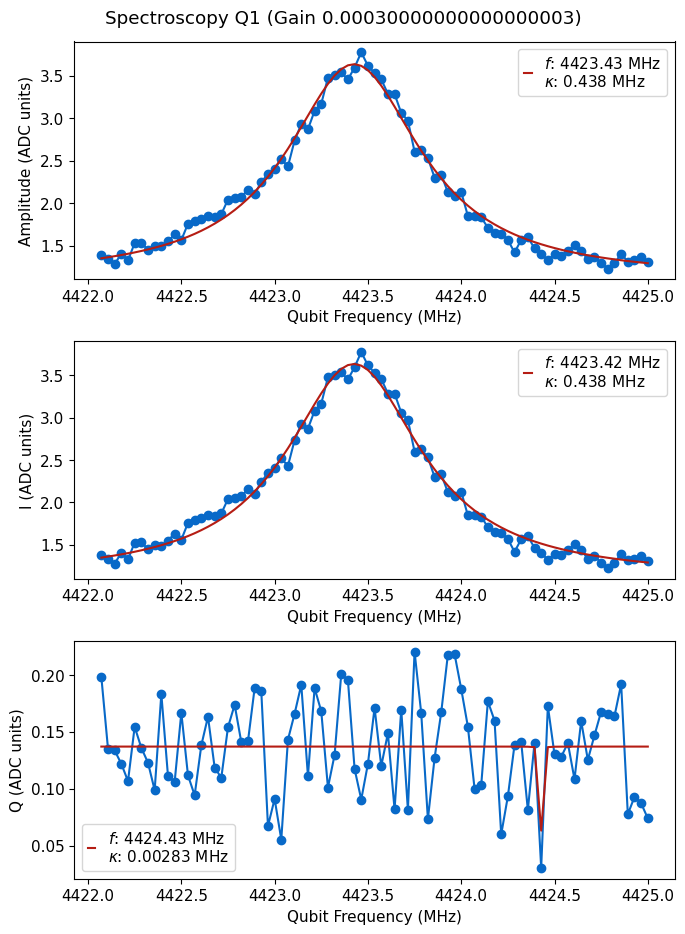

  0%|          | 0/9000 [00:00<?, ?it/s]

R2:0.989	Fit par error:0.011	 Best fit:b'avgi'


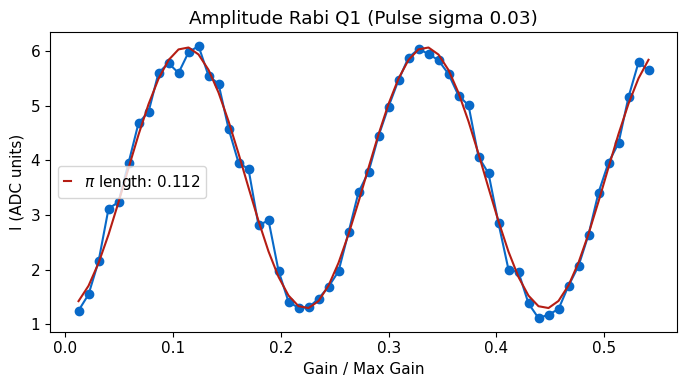

*Set cfg device.qubit 1 ('pulses', 'pi_ge', 'gain') to 0.1117 from 0.1104*
Try 0


  0%|          | 0/30000 [00:00<?, ?it/s]

R2:0.954	Fit par error:0.025	 Best fit:b'avgi'


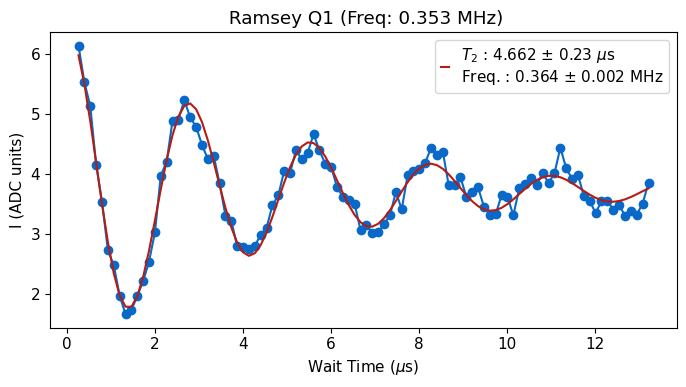

Scan successful. New frequency error is -0.011 MHz
*Set cfg device.qubit 1 f_ge to 4423.5243 from 4423.5357*
*Set cfg device.qubit 1 T2r to 4.6618 from 4.45*
Total Change in frequency: -0.011 MHz
[-0.011382878260297602]
Qubit 1 recentered from 4423.5357 to 4423.5243


  0%|          | 0/9000 [00:00<?, ?it/s]

R2:0.989	Fit par error:0.011	 Best fit:b'avgi'


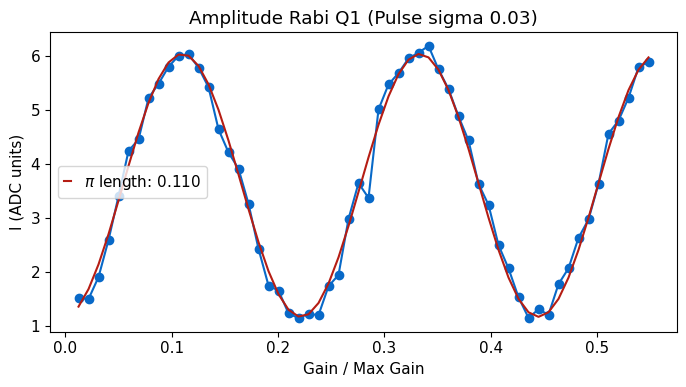

*Set cfg device.qubit 1 ('pulses', 'pi_ge', 'gain') to 0.1099 from 0.1117*


TypeError: SingleShotOptExperiment.__init__() got an unexpected keyword argument 'style'

In [11]:
qubit_list = np.arange(3)
qubit_list=[1]

#qubit_list=np.delete(qubit_list, [5,13])
# Worst issue with this right now is when the qubit frequency is not correct and readout is bad; gets stuck doing ramsey/spectroscopy forever. In this case, cancel it and go back to find qubits, try changing readout gain. 
plt.rcParams.update({'font.size': 11})
for qi in qubit_list: 
    qubit_tuning.tune_up_qubit(qi, cfg_dict, first_time=False, single=True, readout=True)

## Time tracking
fast = True only measures T2r and T1, otherwise does full set of scans.

In [10]:
scan_length = 24 #  hours 

qubit_list = [0,1,2]
tt=time_tracking(qubit_list, cfg_dict,display=False,total_time=scan_length, fast=True)

Starting run 0, for qubit 0. Time elapsed 0.00 hrs
R2:0.991	Fit par error:0.034	 Best fit:b'avgi'
R2:0.931	Fit par error:0.044	 Best fit:b'avgi'
Starting run 0, for qubit 1. Time elapsed 0.00 hrs
R2:0.990	Fit par error:0.044	 Best fit:b'avgi'
R2:0.940	Fit par error:0.042	 Best fit:b'avgi'
Starting run 0, for qubit 2. Time elapsed 0.00 hrs
R2:0.993	Fit par error:0.037	 Best fit:b'avgi'


C:\_Lib\python\slab_qick_calib\analysis\fitting.py:635: RuntimeWarning: overflow encountered in exp
  * np.exp(-x / decay)
c:\Users\slab\anaconda3\envs\slab\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


R2:0.918	Fit par error:0.049	 Best fit:b'avgi'
Starting run 1, for qubit 0. Time elapsed 0.01 hrs
R2:0.979	Fit par error:0.080	 Best fit:b'avgi'
R2:0.984	Fit par error:0.037	 Best fit:b'avgi'
Starting run 1, for qubit 1. Time elapsed 0.01 hrs
R2:0.990	Fit par error:0.033	 Best fit:b'avgi'
R2:0.619	Fit par error:0.241	 Best fit:b'avgi'
Starting run 1, for qubit 2. Time elapsed 0.01 hrs
R2:0.990	Fit par error:0.054	 Best fit:b'avgi'
R2:0.986	Fit par error:0.781	 Best fit:b'avgi'
Starting run 2, for qubit 0. Time elapsed 0.01 hrs
R2:0.987	Fit par error:0.096	 Best fit:b'avgi'
R2:0.951	Fit par error:0.037	 Best fit:b'avgi'
Starting run 2, for qubit 1. Time elapsed 0.01 hrs
R2:0.984	Fit par error:0.040	 Best fit:b'avgi'
R2:0.318	Fit par error:0.342	 Best fit:b'avgi'
Starting run 2, for qubit 2. Time elapsed 0.02 hrs
R2:0.993	Fit par error:0.046	 Best fit:b'avgi'
R2:0.979	Fit par error:0.040	 Best fit:b'avgi'
Starting run 3, for qubit 0. Time elapsed 0.02 hrs
R2:0.989	Fit par error:0.095	 Be

C:\_Lib\python\slab_qick_calib\experiments\general\qick_experiment.py:273: RuntimeWarning: invalid value encountered in sqrt
  data["fit_err_par"] = np.sqrt(np.diag(fit_err)) / fit_pars[inds]


R2:0.524	Fit par error:nan	 Best fit:b'avgi'
R2:0.583	Fit par error:0.266	 Best fit:b'avgi'
Starting run 151, for qubit 2. Time elapsed 0.87 hrs
R2:0.992	Fit par error:0.047	 Best fit:b'avgi'
R2:0.976	Fit par error:0.049	 Best fit:b'avgi'
Starting run 152, for qubit 0. Time elapsed 0.88 hrs
R2:0.986	Fit par error:0.068	 Best fit:b'avgi'
R2:0.972	Fit par error:0.036	 Best fit:b'avgi'
Starting run 152, for qubit 1. Time elapsed 0.88 hrs
R2:0.986	Fit par error:0.038	 Best fit:b'avgi'
R2:0.523	Fit par error:0.187	 Best fit:b'avgi'
Starting run 152, for qubit 2. Time elapsed 0.88 hrs
R2:0.987	Fit par error:0.084	 Best fit:b'avgi'
R2:0.963	Fit par error:0.039	 Best fit:b'avgi'
Starting run 153, for qubit 0. Time elapsed 0.88 hrs
R2:0.987	Fit par error:0.067	 Best fit:b'avgi'
R2:0.982	Fit par error:0.032	 Best fit:b'avgi'
Starting run 153, for qubit 1. Time elapsed 0.88 hrs
R2:0.993	Fit par error:0.028	 Best fit:b'avgi'
R2:0.165	Fit par error:663.103	 Best fit:b'avgi'
R2:0.334	Fit par error:0

C:\_Lib\python\slab_qick_calib\analysis\fitting.py:360: RuntimeWarning: overflow encountered in exp
  return y0 + yscale * np.exp(-x / decay)


R2:0.989	Fit par error:0.033	 Best fit:b'avgi'
R2:nan	Fit par error:nan	 Best fit:b'avgi'
R2:0.354	Fit par error:0.337	 Best fit:b'avgi'
Starting run 235, for qubit 2. Time elapsed 1.36 hrs
R2:0.991	Fit par error:0.062	 Best fit:b'avgi'
R2:0.985	Fit par error:0.031	 Best fit:b'avgi'
Starting run 236, for qubit 0. Time elapsed 1.36 hrs
R2:0.986	Fit par error:0.065	 Best fit:b'avgi'
R2:0.981	Fit par error:0.035	 Best fit:b'avgi'
Starting run 236, for qubit 1. Time elapsed 1.36 hrs
R2:0.991	Fit par error:0.030	 Best fit:b'avgi'
R2:nan	Fit par error:nan	 Best fit:b'avgi'
R2:0.650	Fit par error:0.369	 Best fit:b'avgi'
Starting run 236, for qubit 2. Time elapsed 1.36 hrs
R2:0.993	Fit par error:0.048	 Best fit:b'avgi'
R2:0.984	Fit par error:0.102	 Best fit:b'avgi'
Starting run 237, for qubit 0. Time elapsed 1.36 hrs
R2:0.980	Fit par error:0.075	 Best fit:b'avgi'
R2:0.977	Fit par error:0.030	 Best fit:b'avgi'
Starting run 237, for qubit 1. Time elapsed 1.37 hrs
R2:0.989	Fit par error:0.034	 Be

C:\_Lib\python\slab_qick_calib\analysis\fitting.py:633: RuntimeWarning: overflow encountered in multiply
  yscale


R2:nan	Fit par error:nan	 Best fit:b'avgi'
R2:0.664	Fit par error:0.598	 Best fit:b'avgi'
Starting run 329, for qubit 2. Time elapsed 1.90 hrs
R2:0.987	Fit par error:0.070	 Best fit:b'avgi'
R2:0.975	Fit par error:0.034	 Best fit:b'avgi'
Starting run 330, for qubit 0. Time elapsed 1.90 hrs
R2:0.979	Fit par error:0.096	 Best fit:b'avgi'
R2:0.984	Fit par error:0.031	 Best fit:b'avgi'
Starting run 330, for qubit 1. Time elapsed 1.90 hrs
R2:0.989	Fit par error:0.034	 Best fit:b'avgi'
R2:0.655	Fit par error:0.114	 Best fit:b'avgi'
Starting run 330, for qubit 2. Time elapsed 1.90 hrs
R2:0.986	Fit par error:0.051	 Best fit:b'avgi'
R2:0.967	Fit par error:0.034	 Best fit:b'avgi'
Starting run 331, for qubit 0. Time elapsed 1.91 hrs
R2:0.983	Fit par error:0.163	 Best fit:b'avgi'
R2:0.978	Fit par error:0.039	 Best fit:b'avgi'
Starting run 331, for qubit 1. Time elapsed 1.91 hrs
R2:0.985	Fit par error:0.038	 Best fit:b'avgi'
R2:0.607	Fit par error:4153669.213	 Best fit:b'avgi'
R2:0.604	Fit par error

KeyboardInterrupt: 

In [8]:
cfg_dict

{'soc': <qick.qick_asm.QickConfig at 0x2080a241330>,
 'expt_path': 'C:\\_Data\\Aggron\\2025_06_16\\',
 'cfg_file': 'c:\\_Lib\\python\\slab_qick_calib\\notebooks\\..\\configs\\aggron.yml',
 'im': {'Pyro.NameServer': <Pyro4.core.Proxy at 0x2080a241480; connected IPv4; for PYRO:Pyro.NameServer@192.168.137.1:9090>,
  'chatot': <Pyro4.core.Proxy at 0x2080a242e30; not connected; for PYRO:obj_3ba60199343a44dbaff3c740348d0ef3@192.168.137.104:36851>,
  'Qick105': <Pyro4.core.Proxy at 0x2080a242c50; connected IPv4; for PYRO:obj_f4b864cf17a745fab2fa3611abaf1c9f@192.168.137.105:36685>,
  'Qick233': <Pyro4.core.Proxy at 0x2080a2412d0; not connected; for PYRO:obj_373453b9dad1494b9a8220b56ae711bc@192.168.137.233:41795>}}

## Rabi

### Amplitude

Uses gain/sigma set in pulses part of config

  0%|          | 0/15000 [00:00<?, ?it/s]

R2:0.661	Fit par error:0.047	 Best fit:b'avgi'


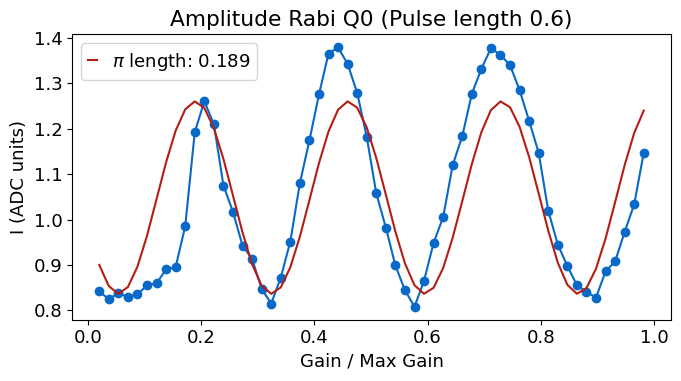

*Set cfg device.qubit 0 ('pulses', 'pi_ge', 'gain') to 0.1894 from 0.36*


In [122]:
qubit_list = np.arange(3)
qubit_list=[0]

update=True

for qi in qubit_list: 
    #amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi)
    
    # Fully customized version
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi)

    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['pi_length'], qi)
        

#### Amp Chevron

  0%|          | 0/20 [00:00<?, ?it/s]

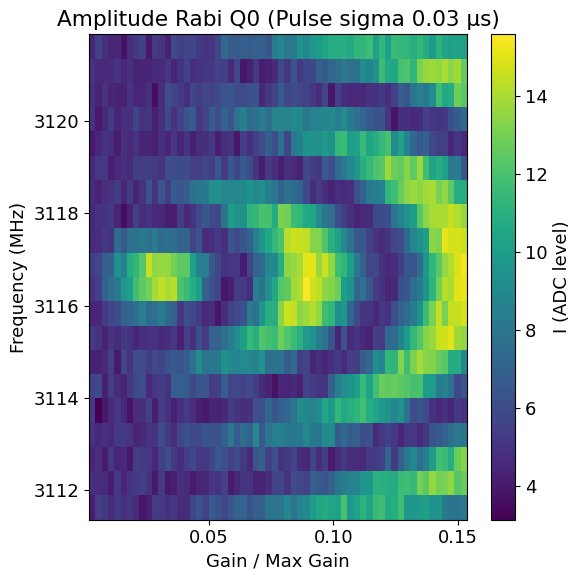

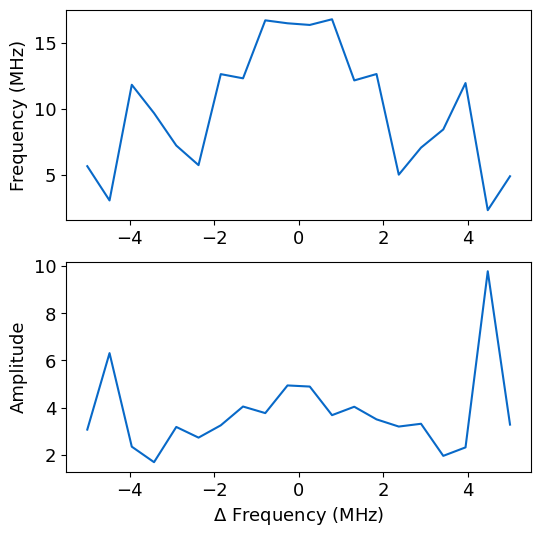

In [6]:
d2=[]
qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list: 
    #amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':200,'sigma':0.25,'expts_f':100,'expts':100})

    amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':10, 'expts_f':20, 'n_pulses':5})
    d2.append(amp_rabi_chevron)

#handy.plot_many(d2, title='Rabi Chevron Phase', save_path=cfg_dict['expt_path'], chan='phases')

In [ ]:
handy.plot_many(d2, title='Rabi Chevron 7864', save_path=cfg_dict['expt_path'])

In [ ]:
amp_rabi_chevron.display(plot_both=True)

### Length -- Uses const pulses so do not use to set up pi pulses

Cannot do fast sweep with gaussian pulses due to multiplying qickparams issues; so need the "loop:True" for those, will make everything slower. 

Unexpected parameters found in params: {'pulse_type'}


  0%|          | 0/15000 [00:00<?, ?it/s]

R2:0.914	Fit par error:0.020	 Best fit:b'avgi'


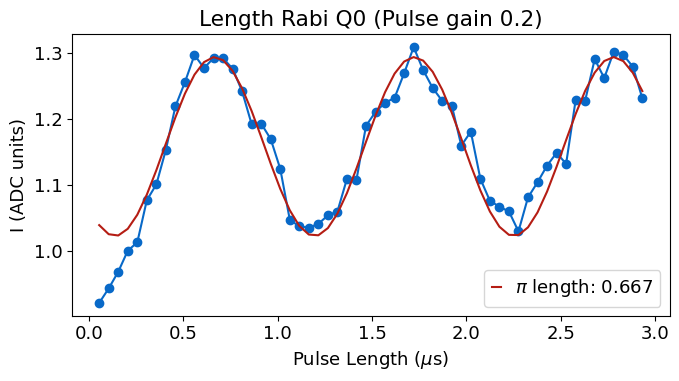

In [124]:
qubit_list = [0]
for qi in qubit_list: 
    # Needs to have params of sweep: length and type: cons
    #len_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'sweep':'length', 'pulse_type':'gauss','loop':True})
    len_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'sweep':'length', 'pulse_type':'const'})

#### Length Chevron

  0%|          | 0/30 [00:00<?, ?it/s]

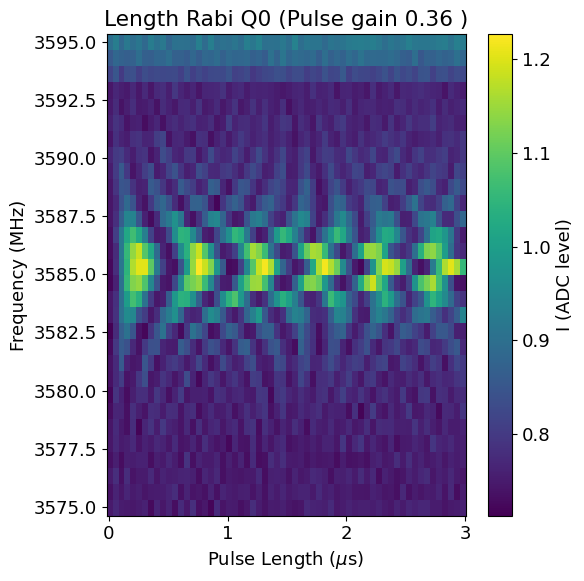

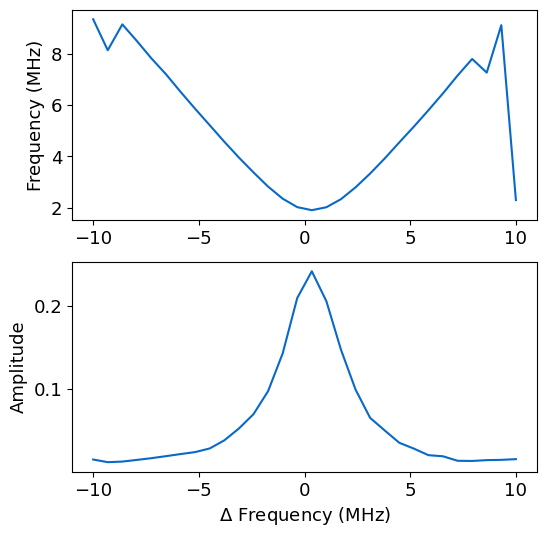

In [121]:
qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list: 
    len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"type":"const", 'sigma':0.605, 'span_f':20})
    #len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"type":"const", 'sigma':0.205, 'expts_f':60, 'span_f':150, 'gain':0.4,'start_f':6280,'rounds':4})

## Ramsey

  0%|          | 0/30000 [00:00<?, ?it/s]

R2:0.943	Fit par error:0.026	 Best fit:b'avgi'


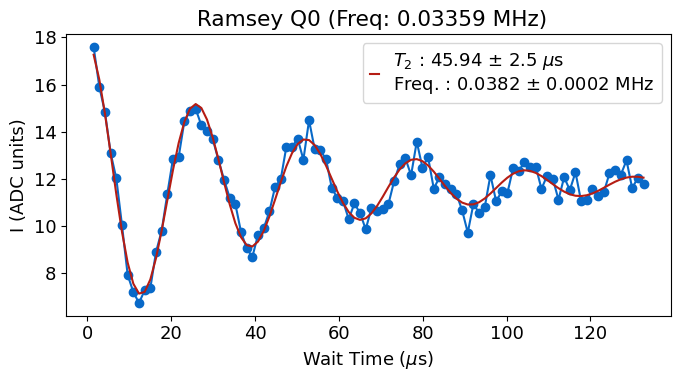

*Set cfg device.qubit 0 f_ge to 3116.6174 from 3116.622*
*Set cfg device.qubit 0 T2r to 45.94 from 44.66*


In [14]:
qubit_list=[0]
update = True

for qi in qubit_list:
    t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10)

    # Manually configured
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10, params = {'ramsey_freq':1,'expts':100, 'span':10,'start':0.01})
    if t2r.status and update:
        config.update_qubit(cfg_path, 'f_ge', t2r.data['new_freq'], qi)
        auto_cfg = config.update_qubit(cfg_path, 'T2r', t2r.data['best_fit'][3], qi, rng_vals=[1.5, max_t1], sig=2)
    else:
        print('T2 Ramsey fit failed')

### Use Ramsey to recenter

In [ ]:
qubit_list = [2]
for qi in qubit_list:
    status = qubit_tuning.recenter(qi,cfg_dict)            

### Ramsey coherence

In [ ]:
t1= qubit_tuning.get_coherence(meas.RamseyExperiment, qi, cfg_dict,par='T2r')

## T1

If it's the first time, also set T2r and T2e as guesses 


  0%|          | 0/18000 [00:00<?, ?it/s]

R2:0.983	Fit par error:0.028	 Best fit:b'avgi'


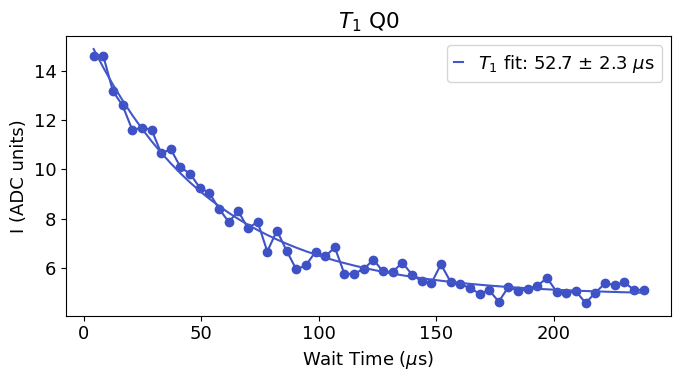

*Set cfg device.qubit 0 T1 to 52.69 from 65.48*
*Set cfg device.readout 0 final_delay to 316.13 from 392.89*


  0%|          | 0/18000 [00:00<?, ?it/s]

R2:0.971	Fit par error:0.051	 Best fit:b'avgi'


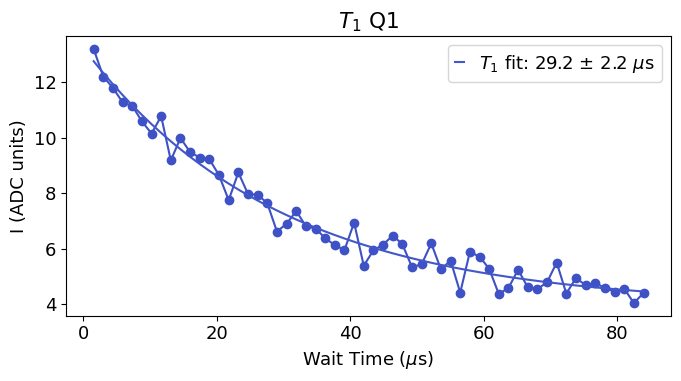

*Set cfg device.qubit 1 T1 to 29.18 from 23.05*
*Set cfg device.readout 1 final_delay to 175.08 from 138.28*


  0%|          | 0/18000 [00:00<?, ?it/s]

R2:0.990	Fit par error:0.029	 Best fit:b'avgi'


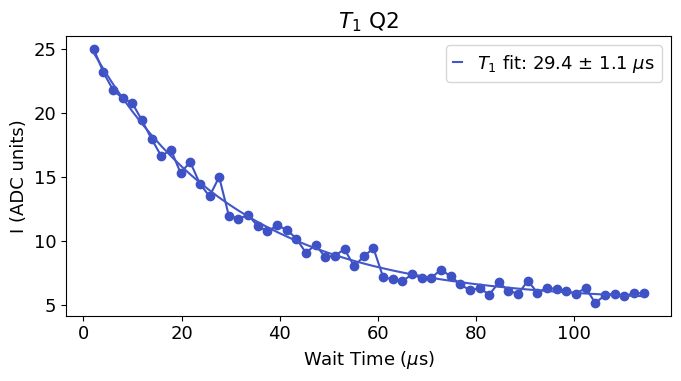

*Set cfg device.qubit 2 T1 to 29.37 from 31.37*
*Set cfg device.readout 2 final_delay to 176.2 from 188.2*


In [23]:
update=True
first_time=False

qubit_list = np.arange(3)
#qubit_list=[0]
for qi in qubit_list:
    t1 = meas.T1Experiment(cfg_dict, qi=qi)
    #t1 = meas.T1Experiment(cfg_dict, qi=qi, params={'reps':1000,'span':0, 'start':20})

    if update: t1.update(cfg_path, first_time=first_time)

### T1 coherence

Runs scan until scan is properly configured to be sensitive to T1

In [ ]:
qi=0
qubit_tuning.get_coherence(meas.T1Experiment,qi=qi,cfg_dict=cfg_dict,par='T1')

### Continuous scan at single point
Times do not seem to be accurate right now 

In [ ]:
qi=0
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':200000})

### T1 continuous 2Q

In [ ]:
qi = [10,0]
meas.T1_2Q(cfg_dict,qi=qi, )

In [ ]:
qi=[0,10]
scan_time = 0.1 #hours
number_of_scans = 1
shots = int(100000*scan_time*60/4)
print(shots)
for i in range(number_of_scans):
    meas.T1Cont2QExperiment(cfg_dict,qi=qi, params={'shots':shots, 'active_reset':False})

## Echo and more

  0%|          | 0/30000 [00:00<?, ?it/s]

R2:0.952	Fit par error:0.022	 Best fit:b'avgi'


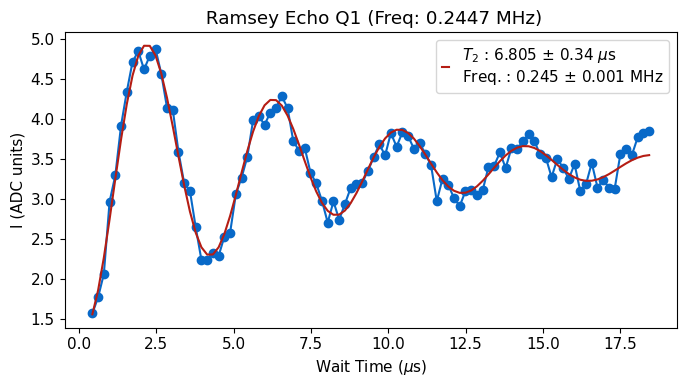

*Set cfg device.qubit 1 T2e to 6.81 from 6.13*


In [17]:
qubit_list = np.arange(3)
qubit_list=[1]
update=True
for qi in qubit_list:
    # Need to have experiment type set to echo
    t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'echo'})
    if t2e.status and update:
        auto_cfg = config.update_qubit(cfg_path, 'T2e', t2e.data['best_fit'][3], qi,sig=2, rng_vals=[1.5, max_t1*2])

### More pi / CPMG
Breaks above 12 right now; need to make it a python loop 

  0%|          | 0/30000 [00:00<?, ?it/s]

R2:0.959	Fit par error:0.039	 Best fit:b'avgi'


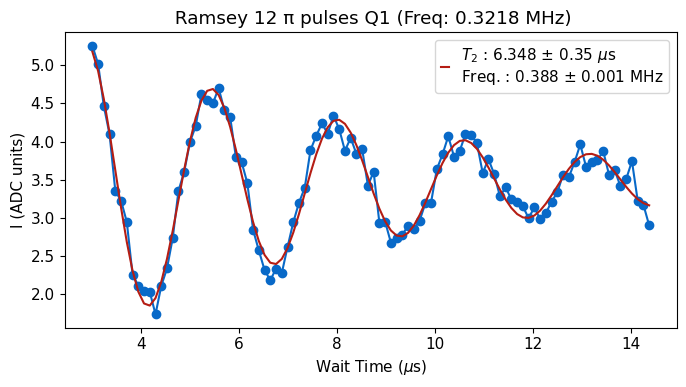

In [19]:
qubit_list = np.arange(3)
qubit_list=[1]
update=True
nums_pi = [12]
for qi in qubit_list:
    for pi in nums_pi:
        # Need to have experiment type set to echo
        t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'cpmg','num_pi':pi})


### Get echo coherence

In [ ]:
qi=6
t2e = qubit_tuning.get_coherence(meas.RamseyEchoExperiment, qi, cfg_dict,'T2e')

## Feedback checks

In [ ]:
qi=10
reset = meas.MemoryExperiment(cfg_dict, qi=qi, params={'shots':1, 'expts':200})

In [ ]:
# Don't do the active reset, just do the repeated measurement 
qi=1
shot = meas.RepMeasExperiment(cfg_dict, qi=qi, params={'shots':30000,'active_reset':True, 'setup_reset':True})
shot.check_reset()

# Single Shot

  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

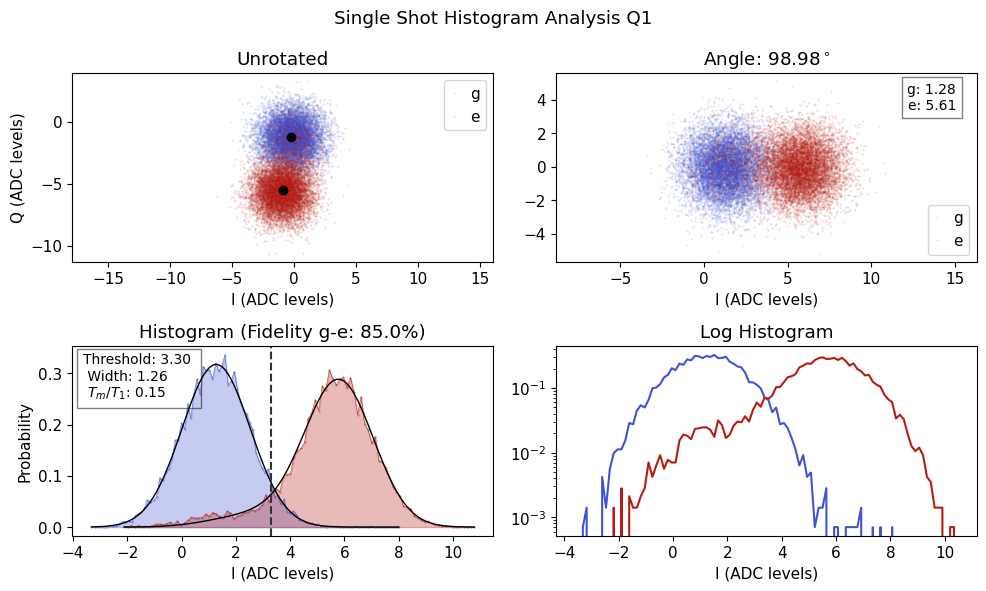

*Set cfg device.readout 1 phase to 98.9775 from 101.235*
*Set cfg device.readout 1 threshold to 3.3014 from 3.3212*
*Set cfg device.readout 1 fidelity to 0.8503 from 0.8898*
*Set cfg device.readout 1 sigma to 1.257 from 1.074*
*Set cfg device.readout 1 tm to 0.1476 from 0.1771*
*Set cfg device.qubit 1 tuned_up to True from True*


In [15]:
# Single shot 
qubit_list = np.arange(3)
qubit_list =[1]

for qi in qubit_list:
    shot=meas.HistogramExperiment(cfg_dict, qi=qi)

    # Configure number of shots
    #shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':300000})
    shot.update(cfg_path)

### Adjust reps for fidelity 

In [ ]:
max_inc = 15 # dont' let it do more than 15x standard number of reps so that things don't take forever
qubit_list = [0]

auto_cfg = config.load(cfg_path)
for qi in qubit_list:
    config.update_readout(cfg_path, 'reps', 1/auto_cfg['device']['readout']['fidelity'][qi]**1.5, qi, rng_vals=[1,max_inc]);

## Readout opt

### General sweep

Runs single shot experiments for many readout lengths, frequencies, gains and compares fidelity

low_gain=True chooses lowest gain/readout length within a few percent of maximum gain (often readout fidelity fairly flat as a function of gain at higher gain values) 

style='fine' varies parameters by 20%, style='' varies by 2x

Unexpected parameters found in params: {'step_f', 'step_gain', 'step_len'}


  0%|          | 0/5 [00:00<?, ?it/s]

Max fidelity 89.688 %
Optimal params: 
 Freq (MHz) 5920.757 
 Gain (DAC units) 0.012 
 Readout length (us) 3.600
Set fidelity: 85.690 %
Set params: 
 Freq (MHz) 5920.757 
 Gain (DAC units) 0.011 
 Readout length (us) 2.700


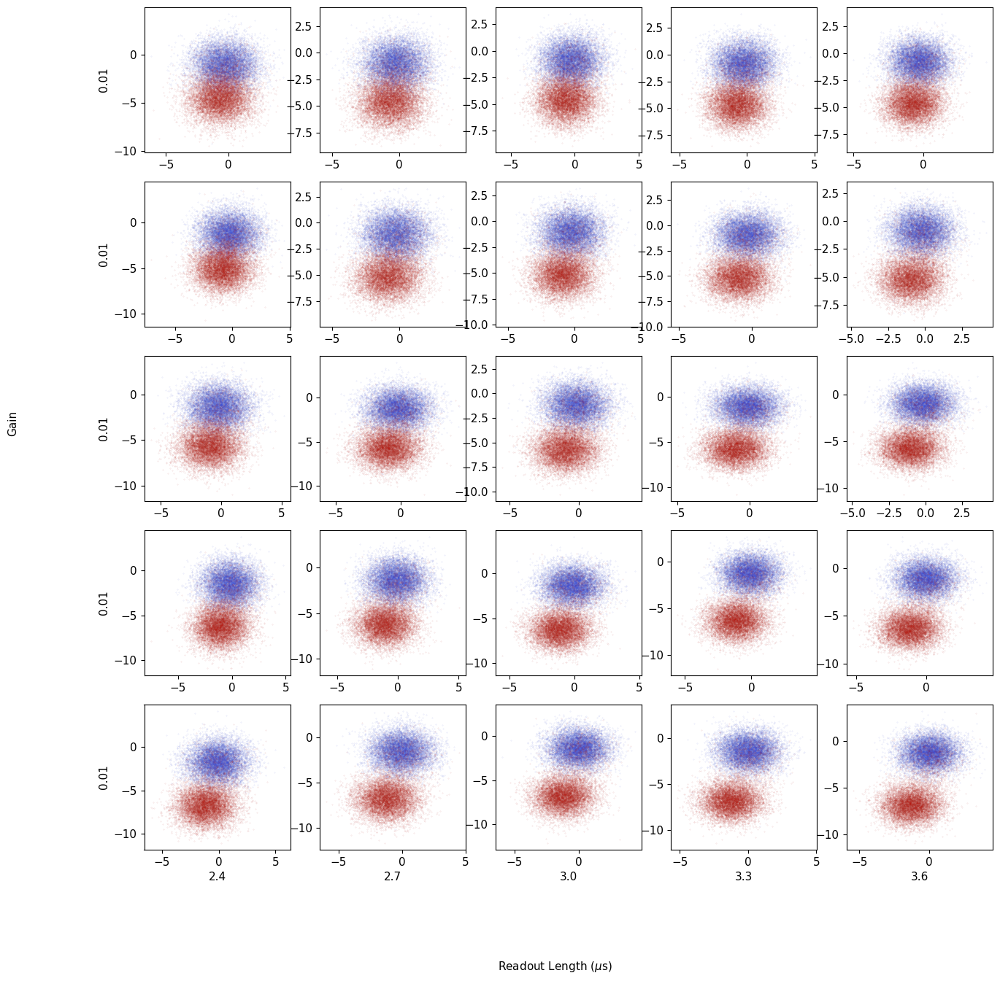

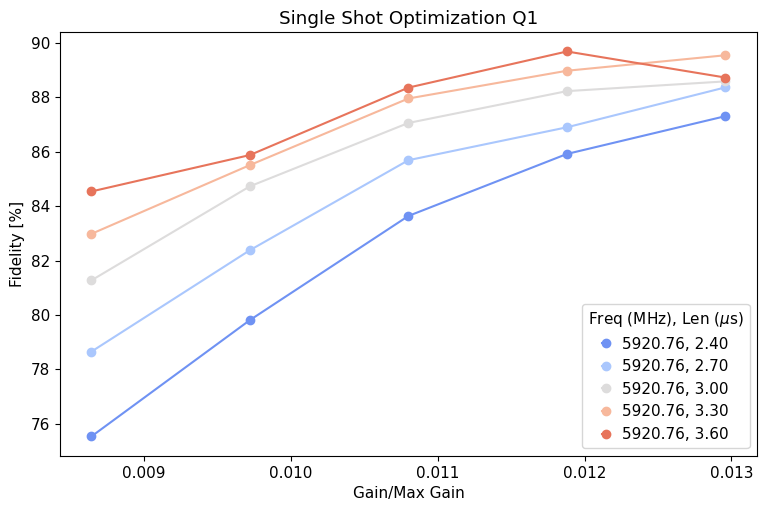

Max fidelity 89.688 %
Optimal params: 
 Freq (MHz) 5920.757 
 Gain (DAC units) 0.012 
 Readout length (us) 3.600
Set fidelity: 85.690 %
Set params: 
 Freq (MHz) 5920.757 
 Gain (DAC units) 0.011 
 Readout length (us) 2.700
*Set cfg device.readout 1 gain to 0.0108 from 0.0108*
*Set cfg device.readout 1 readout_length to 2.7 from 3.0*
*Set cfg device.readout 1 frequency to 5920.7566 from 5920.7566*


In [14]:
update=True
low_gain=True

qubit_list=np.arange(3)
qubit_list=[1]

params = {'expts_f':1, 'expts_gain':5, 'expts_len':5,'shots':10000}
#params = {'expts_f':10, 'expts_gain':1, 'expts_len':1}

# Specify exact ranges to use  
#params = {'expts_f':1, 'expts_gain':9, 'expts_len':9,'start_gain':0.45, 'span_gain':0.05,'start_len':2, 'span_len':5}

for qi in qubit_list: 
    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params=params, style='fine')
    shotopt.analyze(low_gain=low_gain)
    if update: shotopt.update(cfg_dict['cfg_file'])

### Run optimization until it converges

In [ ]:
qubit_list=np.arange(3)
qubit_list=[19]
params = {'expts_f':1, 'expts_gain':7, 'expts_len':7}

# do_res also runs res spec and resets readout frequency that way each round. 
qubit_tuning.meas_opt(cfg_dict, qubit_list, params, do_res=True)

### Vary trig_offset to see if it changes fidelity. 

In [ ]:
# Single shot 
qubit_list = np.arange(3)
qubit_list =[11]
trig_list = np.linspace(0.2,1,12)
fids =[]
for qi in qubit_list:
    for trig in trig_list: 
        config.update_readout(cfg_path, 'trig_offset', trig, qi);
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000, 'trigger':trig})
        fids.append(shot.data['fids'][0])
    

### Play with LO freq (when using qick for LO)

In [ ]:
auto_cfg = config.load(cfg_path)
start_freq = auto_cfg.device.readout.frequency[qi]
start_mixer = auto_cfg.hw.soc.lo.mixer_freq[qi]
rng = np.linspace(-1000,1000,11)
fids=[]
for qi in qubit_list: 
    for r in rng: 
        config.update_lo(cfg_path, 'mixer_freq', start_mixer+r, qi)
        config.update_readout(cfg_path, 'frequency', start_freq-r, qi)
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000})
        fids.append(shot.data['fids'][0])

config.update_lo(cfg_path, 'mixer_freq', start_mixer, qi)
config.update_readout(cfg_path, 'frequency', start_freq, qi)

#### Play with LO power

In [ ]:
qi = 0
gain_vals = [0.0375,0.05] 
fids = []
for gain in gain_vals:
    config.update_lo(cfg_path, 'gain', gain, qi)
    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params={'npts_f':5, 'npts_gain':5, 'npts_len':5})
    fids.append(shot.data['fids'][0])

## Active reset

### Check active reset at standard threshold

Setup reset uses the calibrated angle and runs active reset process at end, but also uses usual final_delay so that it's ok if reset not working

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0,1,2]
d=[]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000,'active_reset':True, 'setup_reset':True})
    shot.check_reset()
    #config.update_readout(cfg_path, 'reset_e', shot.data['reset_e'], qi)
    #config.update_readout(cfg_path, 'reset_g', shot.data['reset_g'], qi)
    d.append(shot)

### Sweep threshold

In [ ]:
d = []
qi=10
auto_cfg = config.load(cfg_path)
threshold = auto_cfg['device']['readout']['threshold'][qi]
thresh = np.linspace(threshold-25,threshold+25,16)
#thresh = np.linspace(threshold-10,threshold+10,6)
for t in thresh:
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':100000,'threshold_v':t, 'active_reset':True,'setup_reset':True}, display=False, progress=False)
    d.append(shot)
    #shot.check_reset()
measure_func.plot_reset(d)

### Turn off active reset for all config chans

In [ ]:
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',False, qi)

### Turn on active reset for channels where it seems to be working

In [ ]:
e_success = 0.15 # Ratio of e proportion after active reset compared to before
g_vs_e = 2 # Ratio of g proportion to e proportion after active reset

auto_cfg = config.load(cfg_path)
reset_e = auto_cfg['device']['readout']['reset_e']
reset_g = auto_cfg['device']['readout']['reset_g']
result = np.array(reset_e)< e_success | np.array(reset_g)/np.array(reset_e)<g_vs_e
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',bool(result[qi]), qi)

### Check reset (plotting result of reset)

In [ ]:
qubit_list = np.arange(3)
qubit_list =[17]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':50000,'active_reset':True})
    shot.check_reset()

# Chi

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

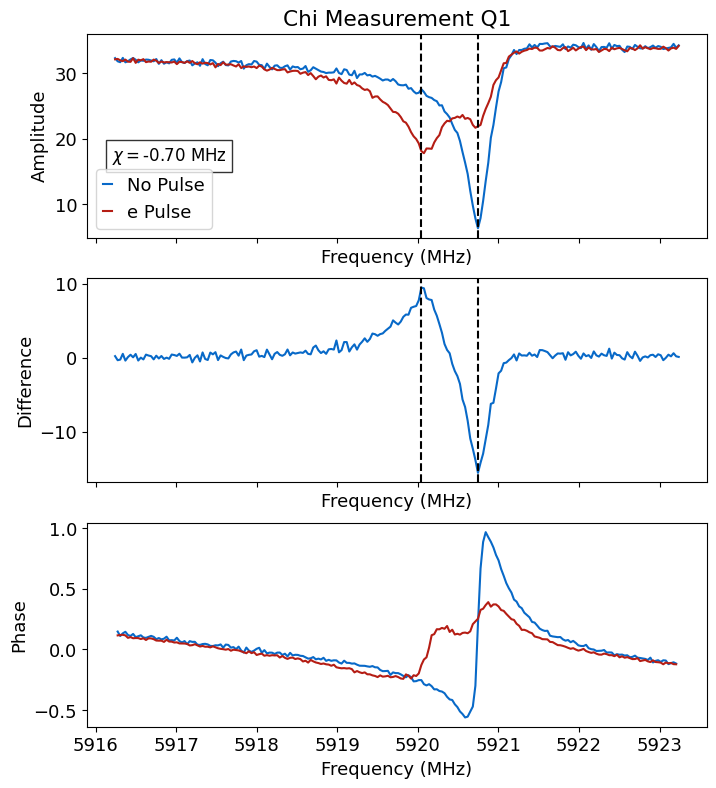

*Set cfg device.readout 1 chi to -0.7029 from -0.639*


In [5]:
# Need a tuned up pi pulse for this

qubit_list = [1]
for qi in qubit_list: 
    chi, chi_val=measure_func.check_chi(cfg_dict, qi)
    auto_cfg = config.update_readout(cfg_path, 'chi', chi_val, qi)

# 2 Qubit

In [ ]:
t12q = meas.T1_2Q(cfg_dict, qi=[10,0], params={'active_reset':False, })

In [ ]:
rabi2q = meas.Rabi_2Q(cfg_dict, qi=[10,0], params={'active_reset':True})

# EF 

### Initial setting of frequencies based on guess for alpha

In [ ]:
# Initial set of the frequencyies based on guess for alpha 
alpha = -150
#qubit_list = np.arange(3)
qubit_list = [1,2]
auto_cfg = config.load(cfg_path)
for i in qubit_list: 
    f_ge = auto_cfg['device']['qubit']['f_ge'][i]
    auto_cfg = config.update_qubit(cfg_path, 'f_ef', f_ge+alpha, i)

## Spectroscopy EF

### General search

In [ ]:
qubit_list= np.arange(3)
bad_qubits=[]
qubit_list=[0,1,2]
for qi in qubit_list:
    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='medium', freq='ef')
    if not status:
        bad_qubits.append(qi)

### Specific width

In [ ]:
# You may want to update this frequency, which will be the center of the scan. 
#style huge, coarse, medium, fine 
update=True

qubit_list = np.arange(3)
qubit_list=[2]
for qi in qubit_list:
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='coarse', params={'checkEF':True, 'gain':1,'reps':2000})#, params={'span':500, 'expts':1000,'reps':500,'gain':0.2})

    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True})#, params={'span':500, 'expts':1000,'reps':500,'gain':0.2})
    if update and qspec.status:
        auto_cfg = config.update_qubit(cfg_path, 'f_ef', qspec.data["best_fit"][2], qi)

## Rabi EF

In [ ]:
# If first time, initialize the sigma and gain to those of the ge 
first_time =False
update = True

qubit_list = np.arange(3)
qubit_list=[0,1,2]

bad_qubits = []
auto_cfg = config.load(cfg_path)

for qi in qubit_list: 
    if first_time:
        #config.update_qubit(cfg_path, 'f_ef', auto_cfg.device.qubit.f_spec_ef[qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','sigma'), auto_cfg['device']['qubit']['pulses']['pi_ge']['sigma'][qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), auto_cfg['device']['qubit']['pulses']['pi_ge']['gain'][qi], qi)
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'checkEF':True})
    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), amp_rabi.data['pi_length'], qi)
    else:
        print(f'Amplitude Rabi fit failed for qubit {qi}')
        bad_qubits.append(qi)

## Qubit Temperature

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0,1,2]
# Setting number of rounds multiplies the default number of rounds by that number, so can be greater than or less than 1. 

for qi in qubit_list: 
    # rounds will make scan take longer, needed for lower temperatures. 
    temp, pop = measure_func.measure_temp(cfg_dict, qi=qi)# , rounds=5)
    auto_cfg = config.update_qubit(cfg_path, 'temp', temp, qi)
    auto_cfg = config.update_qubit(cfg_path, 'pop', pop, qi)

## Calculate Ec and Ej

In [ ]:
auto_cfg = config.load(cfg_path)
import scqubits as scq
for i in np.arange(3):
    alpha =  auto_cfg.device.qubit.f_ef[i] - auto_cfg.device.qubit.f_ge[i]
    en = scq.Transmon.find_EJ_EC(auto_cfg.device.qubit.f_ge[i]/1000,alpha/1000)
    print(alpha)
    print(en)
    q = np.pi*2 * auto_cfg.device.qubit.f_ge[i] * auto_cfg.device.qubit.T1[i]
    print(q)

## Ramsey EF

In [ ]:
update=True
qubit_list=np.arange(3)
#qubit_list=[12]

for qi in qubit_list:
    t2r = meas.T2Experiment(cfg_dict, qi=qi, params={'ramsey_freq':0.15, 'checkEF':True})

    if update and t2r.status:
        config.update_qubit(cfg_path, 'f_ef', t2r.data['new_freq'], qi)
    else:
        print('T2 Ramsey fit failed')

# Stark

## Ramsey

### Single experiment

Unexpected parameters found in params: {'stark_freq'}


  0%|          | 0/2 [00:00<?, ?it/s]

R2:0.982	Fit par error:0.013	 Best fit:b'avgi'


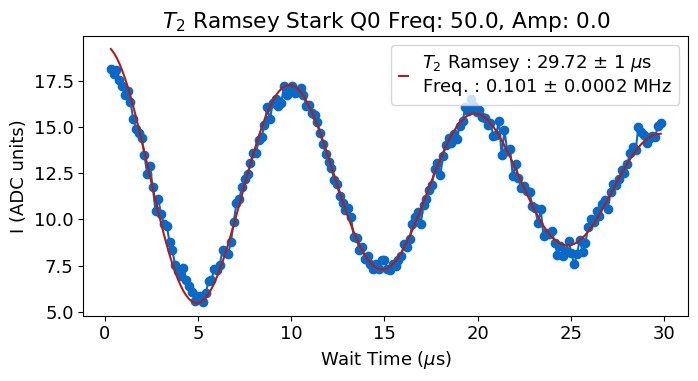

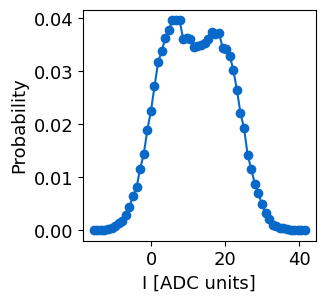

In [15]:
qi=0
meas.RamseyStarkExperiment(cfg_dict, qi=qi, params={'stark_gain':0.0,'df':50,'step':0.15,'acStark':True,'ramsey_freq':0.1})

### Sweep frequency

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

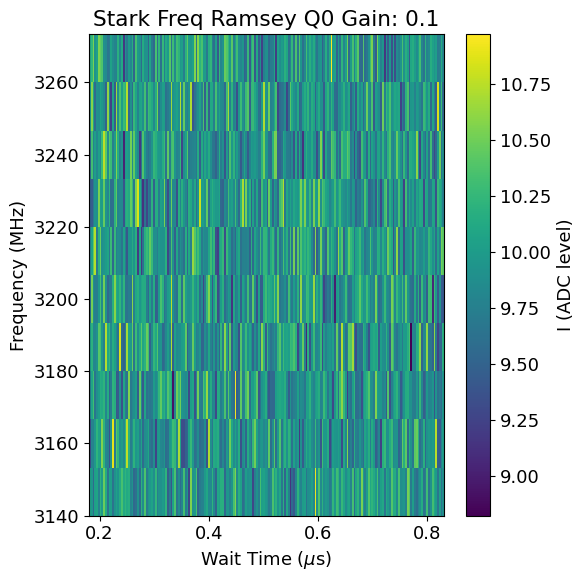

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

KeyboardInterrupt: 

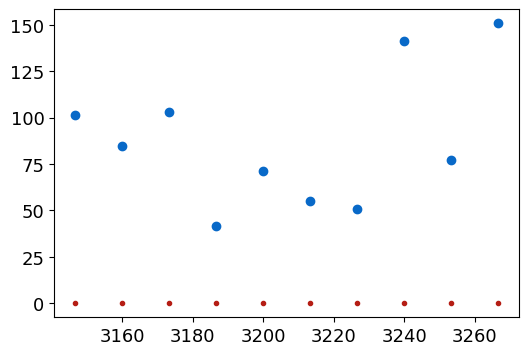

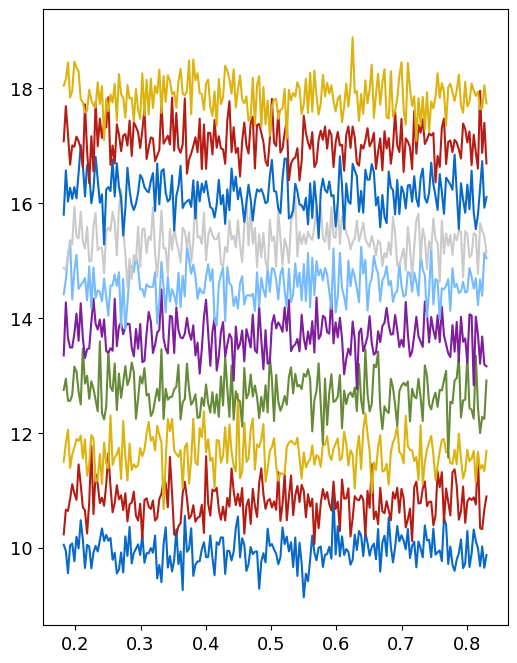

In [9]:
qubit_list = np.arange(3)
qubit_list=[0]

gain = np.linspace(0.1,1,10)
for qi in qubit_list:
    for g in gain:
        t2rstark=meas.RamseyStarkFreqExperiment(cfg_dict, qi=qi, params={'step':1/430+0.001, 'stark_gain':g, 'start_df':30, 'end_df':150, 'expts_df':10})

### Calibrate stark power positive freq

  0%|          | 0/6 [00:00<?, ?it/s]

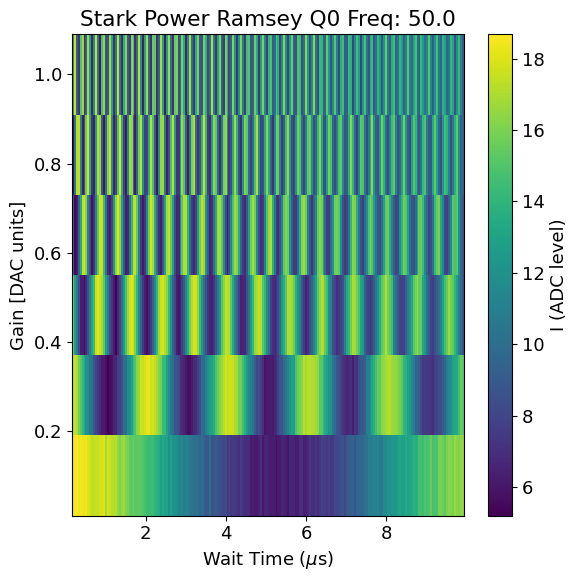

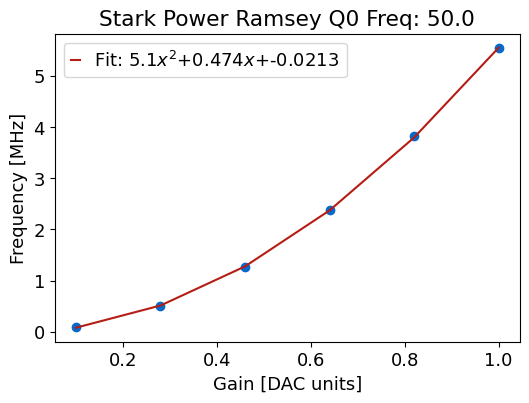

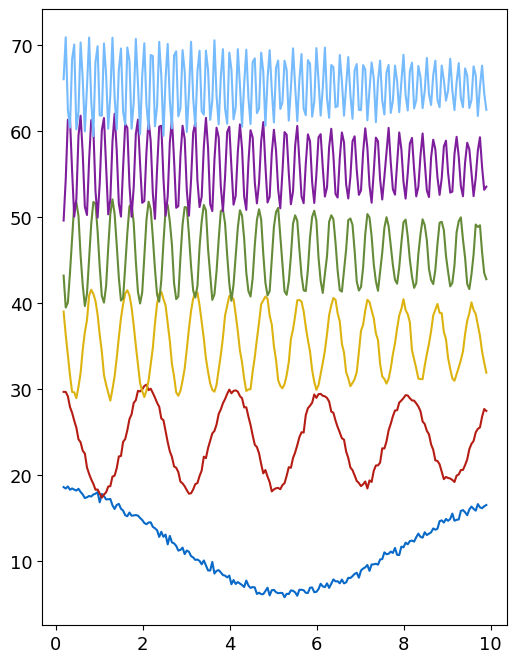

*Set cfg stark 0 q to 5.0982 from -137.5063*
*Set cfg stark 0 l to 0.4737 from 162.7805*
*Set cfg stark 0 o to -0.0213 from 8.9793*


In [16]:
qubit_list = np.arange(3)
qubit_list=[0]
d=[]
freqs= [50]
for f in freqs:
    for qi in qubit_list:
        t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params={'step':0.05, 'expts_gain':6, 'df':f, 'start_gain':0.1, 'end_gain':1})
        d.append(t2rstark)
        config.update_stark(cfg_path, 'q', t2rstark.data['quad_fit'][0], qi)
        config.update_stark(cfg_path, 'l', t2rstark.data['quad_fit'][1], qi)
        config.update_stark(cfg_path, 'o', t2rstark.data['quad_fit'][2], qi)

In [ ]:
plt.figure()
for i in range(len(t2rstark.data['bin_centers'])):
    plt.plot(t2rstark.data['bin_centers'][i], t2rstark.data['hist'][i])

### Negative frequency

  0%|          | 0/12 [00:00<?, ?it/s]

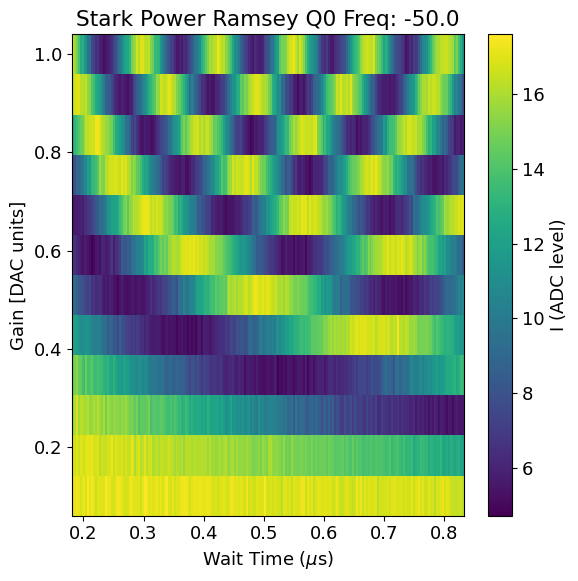

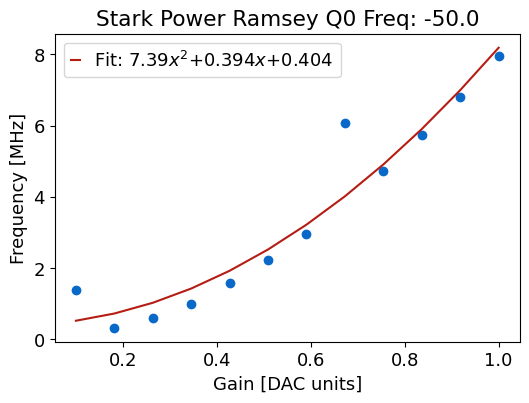

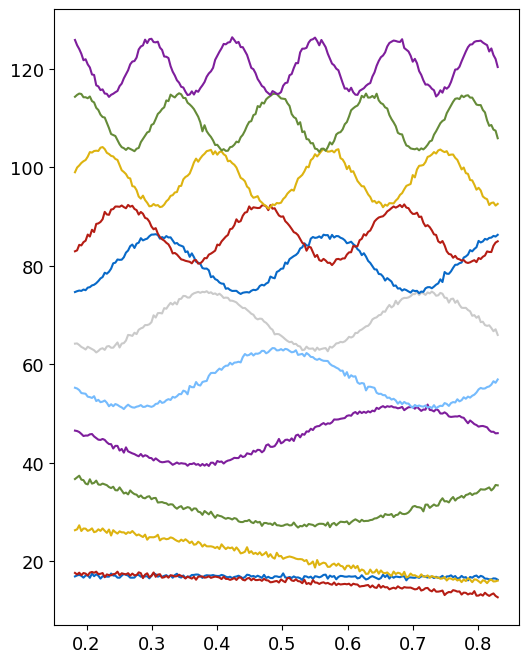

*Set cfg stark 0 qneg to 7.3872 from None*
*Set cfg stark 0 lneg to 0.3936 from None*
*Set cfg stark 0 oneg to 0.4037 from None*


In [19]:
#qubit_list = np.arange(3)
d=[]
qubit_list=[0]
for qi in qubit_list:
    t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params={'step':1/430+0.001, 'expts_gain':12, 'df':-50, 'start_gain':0.1, 'end_gain':1, 'rounds':2})
    d.append(t2rstark)
    config.update_stark(cfg_path, 'qneg', t2rstark.data['quad_fit'][0], qi)
    config.update_stark(cfg_path, 'lneg', t2rstark.data['quad_fit'][1], qi)
    config.update_stark(cfg_path, 'oneg', t2rstark.data['quad_fit'][2], qi)
#handy.plot_many(d, title='Ramsey Stark', save_path=cfg_dict['expt_path'])

## T1

### Single exp

Unexpected parameters found in params: {'stark_freq'}


  0%|          | 0/30000 [00:00<?, ?it/s]

R2:0.921	Fit par error:0.069	 Best fit:b'avgi'


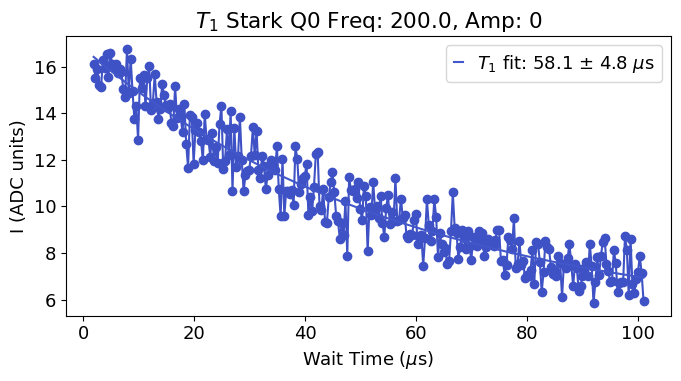

In [21]:
qi=0
gain_list = [0]
for g in gain_list:
    t1 = meas.T1StarkExperiment(cfg_dict, qi=qi, params={'active_reset':False, 'df':200, 'stark_gain':g,'expts':300,'start':1,'span':100,'reps':100}) 

### Gain sweep

Unexpected parameters found in params: {'end_gain', 'stark_freq', 'start_gain', 'expts_gain'}


  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

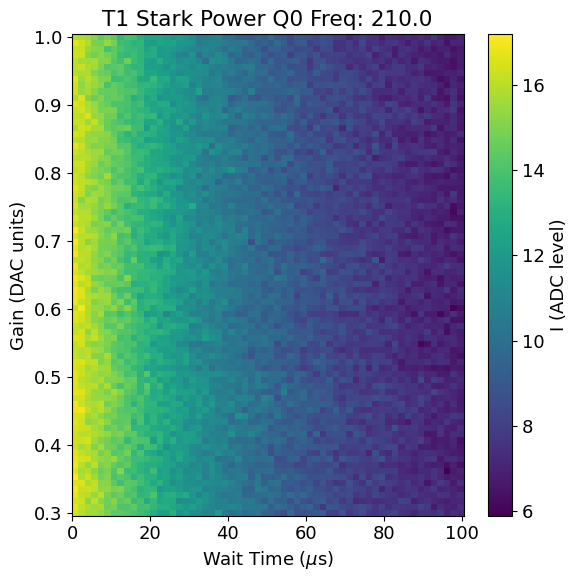

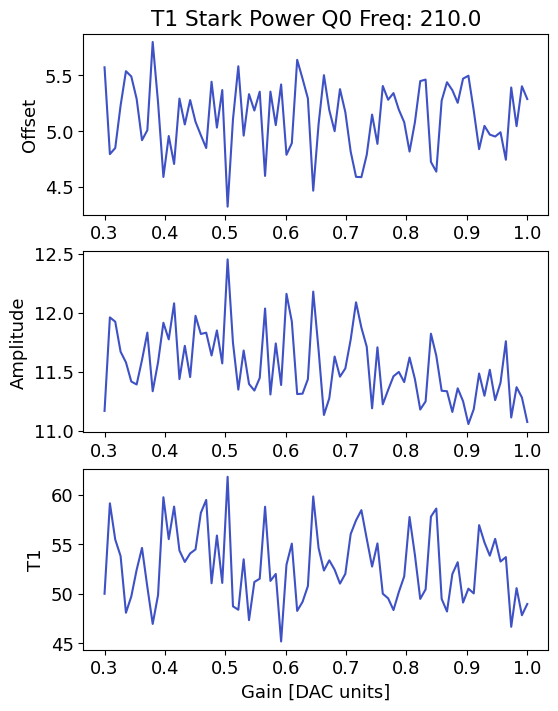

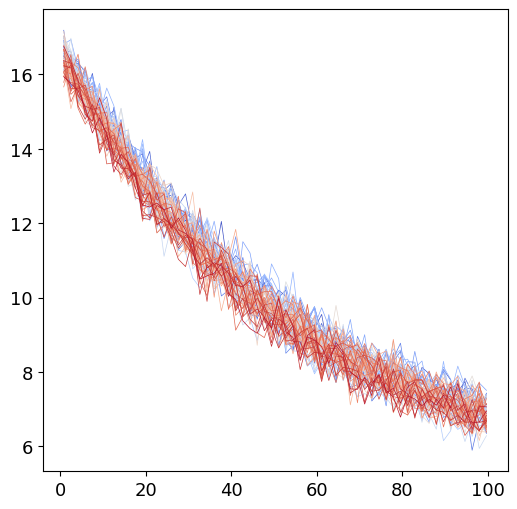

Unexpected parameters found in params: {'end_gain', 'stark_freq', 'start_gain', 'expts_gain'}


  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

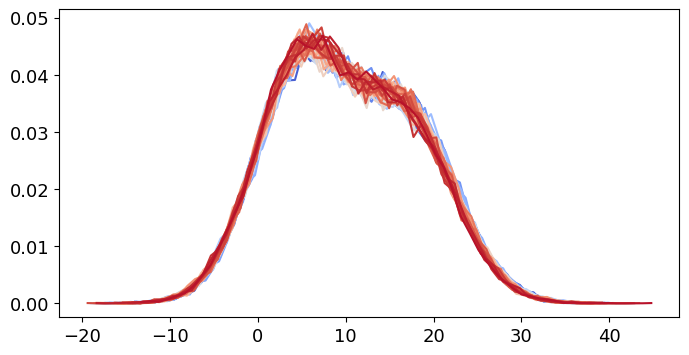

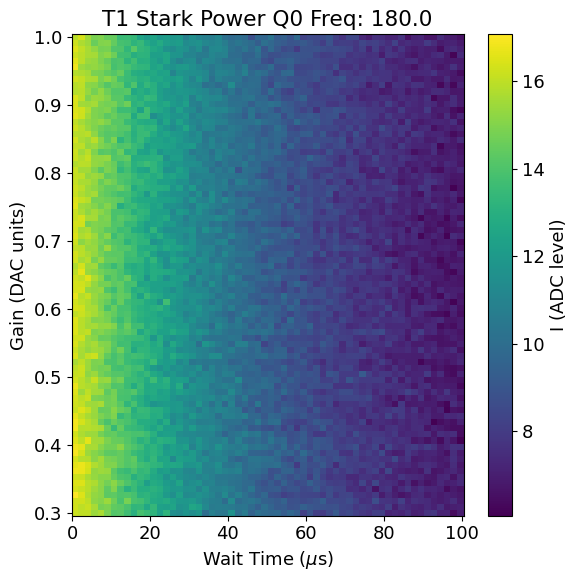

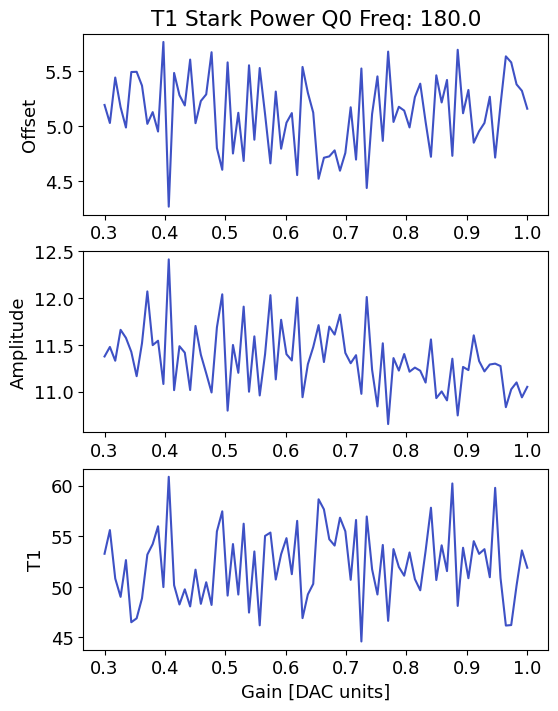

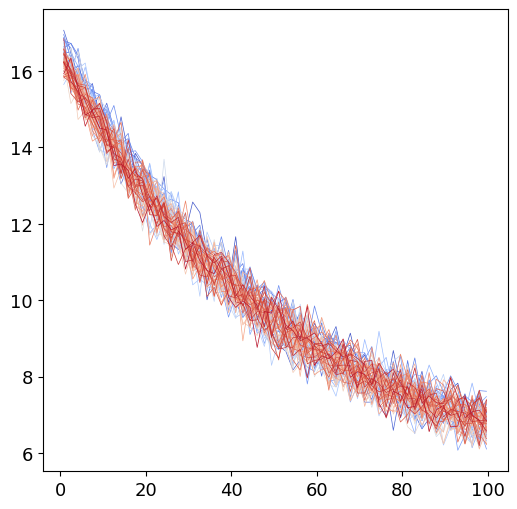

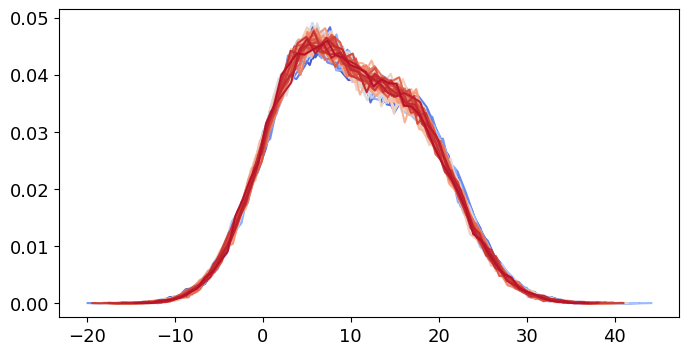

In [22]:
qubit_list = np.arange(3)
qubit_list=[0]
flist=[210,180]
for f in flist:
    for qi in qubit_list: 
        #t1_neg = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params={'df':-70,'start_gain':0.02,'end_gain':0.2,'start':3, 'rounds':4})

        t1_pos = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params={'df':f,'start_gain':0.3,'end_gain':1,'start':0.2, 'rounds':1,'span':99,'expts_gain':80}) 
        plt.figure()
        for i in range(len(t1_pos.data['bin_centers'])):
            plt.plot(t1_pos.data['bin_centers'][i], t1_pos.data['hist'][i])

### Freq sweep

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

  0%|          | 0/27000 [00:00<?, ?it/s]

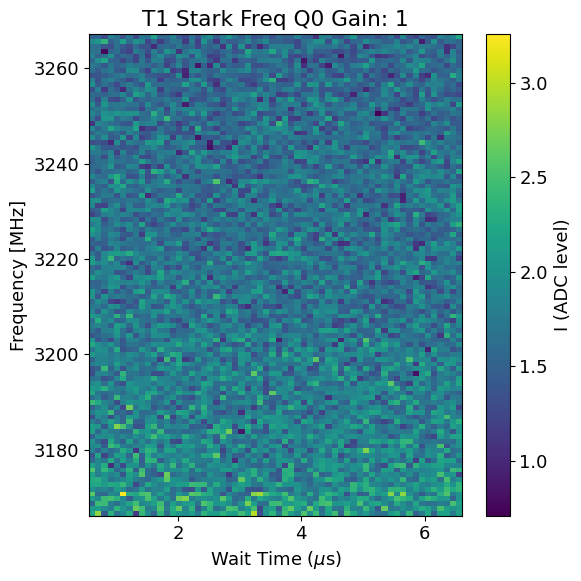

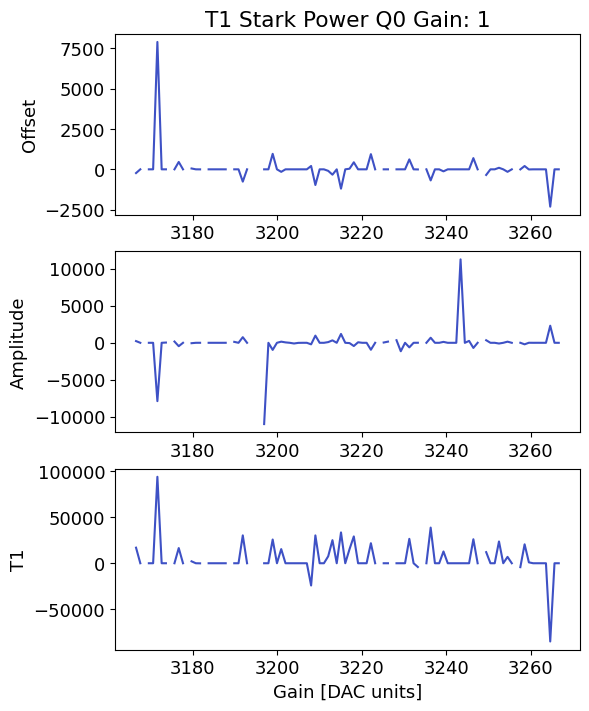

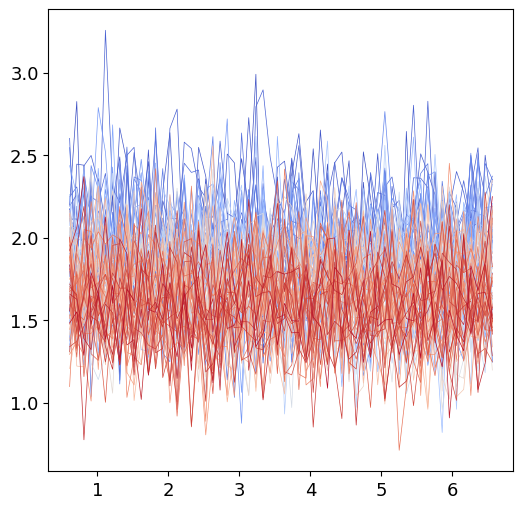

In [27]:
t1_freq = meas.T1StarkFreqExperiment(cfg_dict, qi=0, params={'span':6, 'span_f':100, 'start_df':50, 'expts_f':100})

### Single evo point linear gain sweep

In [ ]:
t1_cont = meas.T1StarkPowerSingle(cfg_dict, qi=0, params={"rounds":4})